https://huggingface.co/docs/transformers/model_doc/segformer

## Loading data and libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import torch
import torch.nn as nn
from torchvision.transforms import functional as FT
import torch.nn.functional as F
from torch import Tensor
from torch import optim
from tqdm import tqdm

import os
import numpy as np

import matplotlib.pyplot as plt

import cv2 as cv

import pandas as pd

from datetime import datetime

from sklearn import metrics as skmetrics

In [3]:
train_images = np.load("/content/drive/MyDrive/VCS Project/dataset/train/images/images.npy", allow_pickle=True)
train_masks = np.load("/content/drive/MyDrive/VCS Project/dataset/train/masks/masks.npy", allow_pickle=True)

## Exploring the dataset

The train dataset consists of 60 images each at a different resolution and slices >= 15

In [19]:
def show_images(image, colorm='viridis'):
  num_slices = image.shape[2]
  fig, axes = plt.subplots(1, num_slices, figsize=(100, 100))
  for i in range(num_slices):
      axes[i].imshow(image[:, :, i], cmap=colorm)
      axes[i].set_title(f'Slice {i + 1}')

  plt.show()

# Showing Images and Masks

def display_image_with_mask(image, mask, alpha=0.35):
    num_slices = image.shape[2]
    fig, axes = plt.subplots(1, num_slices, figsize=(100, 100))

    for i in range(num_slices):

        axes[i].imshow(image[:, :, i], cmap='gray')
        axes[i].set_title(f'Slice {i + 1}')

        axes[i].imshow(mask[:, :, i], cmap='Reds', alpha=alpha)

    plt.show()

def display_1_im_mask(image, mask, alpha=0.5):
    fig, axes = plt.subplots(1, 1, figsize=(75, 75))
    axes.imshow(image, cmap='gray')
    axes.imshow(mask, cmap='Reds', alpha=alpha)
    plt.show()

## Dataset creation

We create the custom dataset, where we have the input images and masks

In [20]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [21]:
class ProstateMRIDataset(Dataset):
    def __init__(self, images, masks, device, transform=None, reduce_label=False):
      # input is already flattened image, so each element of input is an image
        self.images = images
        self.masks = masks
        self.transform = transform
        self.device = device
        # another option get most common dimension of images as target size
        # shapes = np.array([image.shape for image in images])
        # unique_tuples, counts = np.unique(shapes, axis=0, return_counts=True)
        # self.target_size = unique_tuples[np.argmax(counts)]
        self.target_size = (256, 256)
        self.reduce_label = reduce_label


    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]

        image = image.astype(np.float32)
        mask = mask.astype(np.float32)

        assert image.shape == mask.shape, "Input image and mask must have same dimensions"

        # resize images
          # resize down
        if image.shape[0] > self.target_size[0]:
          interpolation = cv.INTER_AREA
          image = cv.resize(image, self.target_size, interpolation=interpolation)
          mask = cv.resize(mask, self.target_size, interpolation=interpolation)
          # resize up
        elif image.shape[0] < self.target_size[0]:
          interpolation = cv.INTER_CUBIC
          image = cv.resize(image, self.target_size, interpolation=interpolation)
          mask = cv.resize(mask, self.target_size, interpolation=interpolation)

        # Do label reduction of mask, 0 is background in our dataset
        if self.reduce_label:
          mask[mask == 0] = 255 # 255 is default ignore index of SegFormer
          mask = mask - 1
          mask[mask == 254] = 255

        image = torch.from_numpy(image).unsqueeze(0)
        # no need to do unsqueeze top add a dimension of size 1 at 0 for masks
        mask = torch.from_numpy(mask)#.unsqueeze(0)

        assert image.shape[0] == 1, "Input image must have a single channel"

        # return just mask
        return image.to(self.device), mask.to(self.device, dtype=torch.int64)

In [22]:
from sklearn.model_selection import train_test_split

test_size_initial = 0.2

train_images_filtered, test_images_filtered, train_masks_filtered, test_masks_filtered = train_test_split(
    train_images, train_masks, test_size=test_size_initial, random_state=42)

validation_size = 0.1

train_images_filtered, validation_images_filtered, train_masks_filtered, validation_masks_filtered = train_test_split(
    train_images_filtered, train_masks_filtered, test_size=validation_size, random_state=42)

In [23]:
def flatten_slices(images):
    return np.array([image[:, :, i] for image in images for i in range(image.shape[2])])

train_images_flatten = flatten_slices(train_images_filtered)
train_masks_flatten = flatten_slices(train_masks_filtered)

validation_images_flatten = flatten_slices(validation_images_filtered)
validation_masks_flatten = flatten_slices(validation_masks_filtered)

test_images_flatten = flatten_slices(test_images_filtered)
test_masks_flatten = flatten_slices(test_masks_filtered)

<ipython-input-23-b13430ce0285>:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([image[:, :, i] for image in images for i in range(image.shape[2])])


In [18]:
id2label = {0: 'background',
              1: 'peripheral zone',
              2: 'central gland'}

label2id = {v: k for k, v in id2label.items()}

## Data Augmentation

Histogram equalization


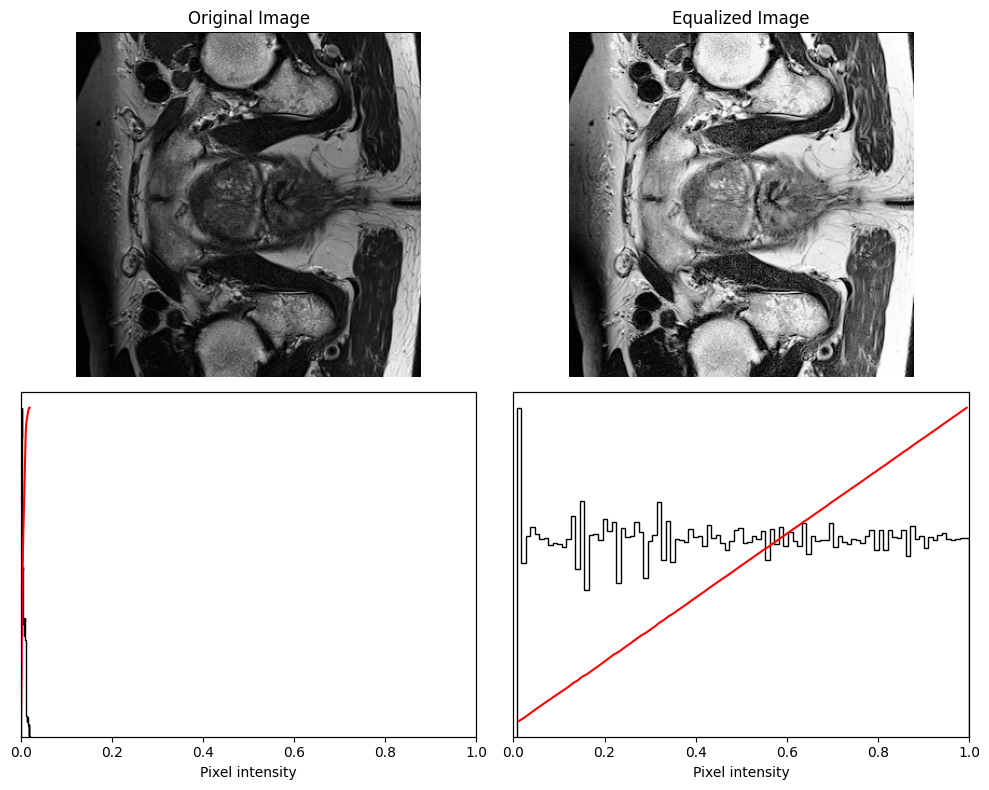

In [ ]:
from skimage import exposure, img_as_float
import matplotlib.pyplot as plt
import numpy as np

def hist_equalise(dataset):
    # Perform histogram equalization on each scan slice
    for i in range(len(dataset)): # Over subjects
          dataset[i] = exposure.equalize_hist(dataset[i])

def plot_img_and_hist(image, axes, bins=100):
    # Plot an image along with its histogram and cumulative histogram.
    # Code adapted from: http://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_equalize.html
    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf

def plot_histogram_equalisation(img_org, img_heq):
    # Plot original low contrast image and histogram eualised image, with their histograms and cumulative histograms.
    # Code adapted from: http://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_equalize.html

    fig = plt.figure(figsize=(7, 7))
    axes = np.zeros((2, 2), dtype=np.object)
    axes[0, 0] = fig.add_subplot(2, 2, 1)
    for i in range(1, 2):
        axes[0, i] = fig.add_subplot(2, 2, 1+i, sharex=axes[0,0], sharey=axes[0,0])
    for i in range(0, 2):
        axes[1, i] = fig.add_subplot(2, 2, 3+i)

    ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_org, axes[:, 0])
    ax_img.set_title('Original low contrast image')

    y_min, y_max = ax_hist.get_ylim()
    ax_hist.set_ylabel('Number of pixels')
    ax_hist.set_yticks(np.linspace(0, y_max, 5))

    ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_heq, axes[:, 1])
    ax_img.set_title('Histogram equalised image')

    ax_cdf.set_ylabel('Fraction of total intensity', color='red')
    ax_cdf.set_yticks(np.linspace(0, 1, 5))

    fig.tight_layout(h_pad=-1.5)
    plt.show()

def visualize_histogram_equalization(original, equalized):
    # Visualize original and equalized images with their histograms
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    plot_img_and_hist(original, axes[:, 0])
    axes[0, 0].set_title('Original Image')

    plot_img_and_hist(equalized, axes[:, 1])
    axes[0, 1].set_title('Equalized Image')

    plt.tight_layout()
    plt.show()


# Visualize the results for a single subject and slice (modify indices as needed)
subject_index = 8
original_image = train_images_flatten[subject_index]
equalized_image = exposure.equalize_hist(original_image)

# Visualize the results
visualize_histogram_equalization(original_image, equalized_image)

# Apply histogram equalization to the datasets
hist_equalise(train_images_flatten)
hist_equalise(validation_images_flatten)
hist_equalise(test_images_flatten)

In [ ]:
from scipy.ndimage import map_coordinates, gaussian_filter
import scipy
import time
import numpy as np
import random

def rotate(voxels, lbls, theta=None):
    # Rotate volume by a minor angle (+/- 10 degrees: determined by investigation of dataset variability)
    if theta is None:
        theta = random.randint(-10, 10)
    vox_new = scipy.ndimage.rotate(voxels, theta, reshape=False)
    lbl_new = scipy.ndimage.rotate(lbls, theta, reshape=False)
    return vox_new, lbl_new


def scale_and_crop(voxels, lbls):
    # Scale the volume by a minor size and crop around centre (can also modify for random crop)
    o_s = voxels.shape
    r_s = [0] * len(o_s)
    scale_factor = random.uniform(1, 1.2)
    vox_zoom = scipy.ndimage.zoom(voxels, scale_factor, order=1)
    lbl_zoom = scipy.ndimage.zoom(lbls, scale_factor, order=0)
    new_shape = vox_zoom.shape
    # Start with offset
    for i in range(len(o_s)):
        if new_shape[i] == 1:
            r_s[i] = 0
            continue
        r_c = int(((new_shape[i] - o_s[i]) - 1) / 2)
        r_s[i] = r_c
    r_e = [r_s[i] + o_s[i] for i in range(len(o_s))]

    # Adjust indexing for 2D arrays
    vox_zoom = vox_zoom[r_s[0]:r_e[0], r_s[1]:r_e[1]]
    lbl_zoom = lbl_zoom[r_s[0]:r_e[0], r_s[1]:r_e[1]]


    return vox_zoom, lbl_zoom

def grayscale_variation(voxels, lbls):
    # Introduce a random global increment in gray-level value of volume.
    im_min = np.min(voxels)
    im_max = np.max(voxels)
    mean = np.random.normal(0, 0.1)
    smp = np.random.normal(mean, 0.01, size=np.shape(voxels))
    voxels = voxels + im_max * smp
    voxels[voxels <= im_min] = im_min  # Clamp to min value
    voxels[voxels > im_max] = im_max  # Clamp to max value
    return voxels, lbls


def elastic_deformation(voxels, lbls, alpha=None, sigma=None, mode="constant", cval=0, is_random=False):
    # Apply elastic deformation/distortion to the volume
    # Adapted from: https://tensorlayer.readthedocs.io/en/stable/_modules/tensorlayer/prepro.html#elastic_transform
    if alpha is None:
        alpha = voxels.shape[0] * 3.0
    if sigma is None:
        sigma = voxels.shape[0] * 0.07
    if is_random is False:
        random_state = np.random.RandomState(None)
    else:
        random_state = np.random.RandomState(int(time.time()))

    shape = voxels.shape
    dx = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma, mode=mode, cval=cval) * alpha
    dy = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma, mode=mode, cval=cval) * alpha
    x_, y_ = np.meshgrid(np.arange(shape[0]), np.arange(shape[1]), indexing='ij')
    indices = np.reshape(x_ + dx, (-1, 1)), np.reshape(y_ + dy, (-1, 1))

    new_voxels = np.zeros_like(voxels)
    new_lbls = np.zeros_like(lbls)
    new_voxels[:, :] = map_coordinates(voxels[:, :], indices, order=1).reshape(shape[:2])
    new_lbls[:, :] = map_coordinates(lbls[:, :], indices, order=1).reshape(shape[:2])

    return new_voxels, new_lbls

def get_random_perturbation(voxels, lbls):
    # Generate a random perturbation of the input feature + label
    new_voxels, new_lbls = voxels, lbls
    p = 0.6
    if random.random() < p:
        new_voxels, new_lbls = rotate(new_voxels, new_lbls)
    if random.random() < p:
        new_voxels, new_lbls = scale_and_crop(new_voxels, new_lbls)
    if random.random() < p:
        new_voxels, new_lbls = grayscale_variation(new_voxels, new_lbls)
    if random.random() < p:
        new_voxels, new_lbls = elastic_deformation(new_voxels, new_lbls)
    return new_voxels, new_lbls

In [ ]:
import copy

# Assuming train_images_filtered and train_masks_filtered are your original datasets
# Create new lists to store augmented images and masks
augmented_train_images = []
augmented_train_masks = []

# Number of augmentations per original pair
num_augmentations = 2

# Apply perturbation and save augmented pairs
for i in range(len(train_images_flatten)):
    original_image = train_images_flatten[i]
    original_mask = train_masks_flatten[i]

    augmented_train_images.append(original_image)
    augmented_train_masks.append(original_mask)

    for _ in range(num_augmentations):
        augmented_image, augmented_mask = get_random_perturbation(copy.deepcopy(original_image),
                                                                  copy.deepcopy(original_mask))
        augmented_train_images.append(augmented_image)
        augmented_train_masks.append(augmented_mask)

## Data loader creation

Train

In [28]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 16

train_dataset = ProstateMRIDataset(np.array(augmented_train_images), np.array(augmented_train_masks), device=device)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

NameError: name 'augmented_train_images' is not defined

Test & validation

In [29]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

validation_dataset = ProstateMRIDataset(np.array(validation_images_flatten), np.array(validation_masks_flatten), device)
test_dataset = ProstateMRIDataset(np.array(test_images_flatten), np.array(test_masks_flatten), device)

validation_loader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

https://arxiv.org/pdf/1511.00561.pdf

https://github.com/vinceecws/SegNet_PyTorch/tree/master

## Model definition: import pre trained

We start off by loading the pre trained model if we have no previous checkpoints.

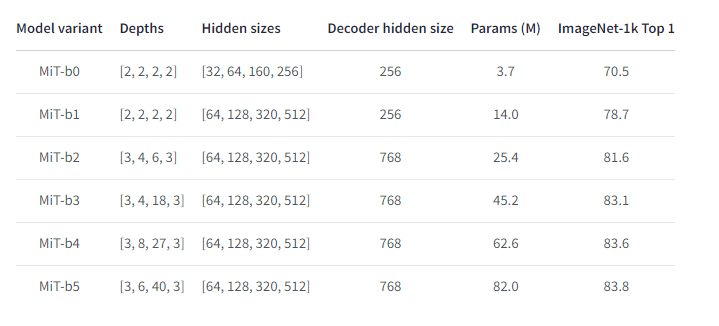

In [ ]:
from transformers import SegformerForSemanticSegmentation, SegformerConfig

# Load SegformerForSemanticSegmentation with pretrained weights
model = SegformerForSemanticSegmentation.from_pretrained("nvidia/mit-b0", # select model
                                                         num_labels=len(id2label),
                                                         id2label=id2label,
                                                         label2id=label2id)

config.json:   0%|          | 0.00/70.0k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/14.4M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.running_var', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.0.proj.weight', 'decode_head.batch_norm.bias', 'decode_head.batch_norm.running_mean', 'decode_head.linear_fuse.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.batch_norm.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# modify model to work with 1 channel input (grayscale)
model.segformer.encoder.patch_embeddings[0].proj = nn.Conv2d(1, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))

## Metrics definition

In [31]:
def dice_coefficient(predictions, labels, num_labels, eps = 1e-7):
  """predictions and labels as numpy ndarrays
  unique labels should be in range(num_labels)

  output: dict of dice coefs per label and unweighted average"""
  assert predictions.shape == labels.shape, "predictions and labels must have same shape"

  # Flatten batches into single vector
  pred_flat = predictions.flatten()
  labels_flat = labels.flatten()

  dice_coefs = {}
  sum_dice = 0

  for label in range(num_labels):
    intersection = np.sum(pred_flat[labels_flat==label]==label) + eps
    union = (np.sum(pred_flat[pred_flat==label]==label) + np.sum(labels_flat[labels_flat==label]==label)) + eps
    dice_coefs[f'dice_{id2label[label]}'] = 2.0 * intersection / union

    sum_dice += dice_coefs[f'dice_{id2label[label]}']

  dice_coefs['dice_unweighted_avg'] = sum_dice / num_labels

  return dice_coefs

In [ ]:
def flatten_dict(input_dict, parent_key='', sep='_'):
    """
    Flatten a nested dictionary with ndarrays

    Parameters:
    - input_dict (dict): The input dictionary to be flattened.
    - parent_key (str): The prefix to be added to the keys.
    - sep (str): The separator to use when concatenating keys.

    mean_iou returns:
    - *per_category_accuracy* (`ndarray` of shape `(num_labels,)`):
        Per category accuracy.
    - *per_category_iou* (`ndarray` of shape `(num_labels,)`):
        Per category IoU.

    Returns:
    - dict: The flattened dictionary.
    """
    flat_dict = {}
    for key, value in input_dict.items():
        new_key = f"{parent_key}{sep}{key}" if parent_key else key
        if isinstance(value, np.ndarray):
            for i, num in enumerate(value):
              flat_dict[f'{new_key}_{id2label[i]}'] = num
        else:
            flat_dict[new_key] = value
    return flat_dict

In [24]:
from sklearn import metrics as skmetrics

def compute_display_metrics(predictions, references, metric, dice_coef_metric, loss, num_labels=len(id2label),
                            ignore_index=255, reduce_labels=False):
  """ Inputs predictions, refernces as numpy ndarrays
  metric is from Hub
  dice_coef_metric: custom dice coef function
  output: metrics dict"""

  all_metrics_flat = {}

  # note that the metric expects predictions + labels as numpy arrays
  print('Adding batch metrics to cache...')
  metric.add_batch(predictions=predictions, references=references)

  # Accuracy and iou from Hugging Face Hub
  print('Computing general metrics...')
  metrics = metric._compute(
                predictions = predictions,
                references = references,
                num_labels = num_labels,
                ignore_index = ignore_index, # we don't want to ignore 0 index in metrics
                reduce_labels=reduce_labels, # already reduced labels in Dataset
            )

  # Dice coefficient
  print('Computing dice coefficient...')
  dice_c = dice_coef_metric(
                predictions=predictions,
                labels=references,
                num_labels = num_labels
            )

  # Add metrics to flat dict
  all_metrics_flat['Loss'] = loss.item()
  # Add dice coeffs
  for key, value in dice_c.items():
    all_metrics_flat[key] = value
  # Flatten and add metrics from hub function (acc iou)
  flat_metrics_hub = flatten_dict(metrics, parent_key='', sep='_')
  for key, value in flat_metrics_hub.items():
    all_metrics_flat[key] = value

  # Print metrics
  for key, value in all_metrics_flat.items():
    print(f'{key} = {value}')

  references = references.flatten()
  predictions = predictions.flatten()
  recall_per_label = skmetrics.recall_score(y_true= references, y_pred=predictions, average=None)
  all_metrics_flat['recall_per_label'] = recall_per_label
  all_metrics_flat['avg_recall_weighted']  = skmetrics.recall_score(y_true= references, y_pred=predictions, average='micro')
  all_metrics_flat['avg_recall_unweighted']  = skmetrics.recall_score(y_true= references, y_pred=predictions, average='macro')

  f1 = skmetrics.f1_score(y_true= references, y_pred=predictions, average=None)
  all_metrics_flat['f1_per_label'] = f1
  all_metrics_flat['f1_weighted']  = skmetrics.f1_score(y_true= references, y_pred=predictions, average='micro')
  all_metrics_flat['f1_unweighted']   = skmetrics.f1_score(y_true= references, y_pred=predictions, average='macro')

  prec = skmetrics.precision_score(y_true= references, y_pred=predictions, average=None)
  all_metrics_flat['precision_per_label'] = prec
  all_metrics_flat['prec_weighted']  = skmetrics.precision_score(y_true= references, y_pred=predictions, average='micro')
  all_metrics_flat['prec_unweighted'] = skmetrics.precision_score(y_true= references, y_pred=predictions, average='macro')

  jacc = skmetrics.jaccard_score(y_true= references, y_pred=predictions, average=None)
  all_metrics_flat['jaccard_score_per label'] = jacc
  all_metrics_flat['jacc_weighted']  = skmetrics.jaccard_score(y_true= references, y_pred=predictions, average='micro')
  all_metrics_flat['jacc_unweighted'] = skmetrics.jaccard_score(y_true= references, y_pred=predictions, average='macro')

  return all_metrics_flat

Import accuracy and iou metric function from the Hub

In [37]:
!pip3 -q install evaluate
#import evaluate
# Metric from Hub
mean_iou = evaluate.load("mean_iou")

NameError: name 'evaluate' is not defined

https://github.com/huggingface/evaluate/tree/main/metrics/mean_iou


## Model training: fine tuning

In [ ]:
# optional: load model from previous checkpoint save
continue_checkpoint = False
if continue_checkpoint:
  model = torch.load("/content/drive/MyDrive/Project/models/checkpoints/20240202_23_epoch_140_SegFormer_reduced_labels_train_metrics.csv")

Evaluation function

In [16]:
@torch.no_grad()
def model_eval(model, test_dataloader, metric, dice_coef_metric):
  model.eval()
  model.to(device)
  for bnum, batch in enumerate(test_dataloader):

    # get the inputs;
    pixel_values = batch[0].to(device)
    labels = batch[1].to(device)

    # forward + backward + optimize
    outputs = model(pixel_values=pixel_values, labels=labels)
    loss, logits = outputs.loss, outputs.logits

    upsampled_logits = nn.functional.interpolate(logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
    predicted = upsampled_logits.argmax(dim=1)

    # note that the metric expects predictions + labels as numpy arrays
    predictions = predicted.detach().cpu().numpy()
    references = labels.detach().cpu().numpy()
    metrics = compute_display_metrics(predictions = predictions,
                                      references = references, metric = metric,
                                      dice_coef_metric = dice_coef_metric, loss = loss)

    return pixel_values.cpu().numpy(), labels.cpu().numpy(), predicted.cpu().numpy(), metrics

In [ ]:
# Define the directory where you want to save the checkpoints
checkpoint_dir = "/content/drive/MyDrive/Project/models/checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

# Define hyperparameters
model_name = "SegFormer_aug_eq"
epochs = 100
optimizer = torch.optim.AdamW(model.parameters(), lr=0.00006)

Main training function with inference on validation and metrics calculation

In [ ]:
def train_model(train_dataloader,  model, epochs, metric, dice_coef_metric, model_name, val_dataloader=None,):
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  model.train()
  model.to(device)
  acc_training_metrics = []
  acc_validation_metrics = []

  for epoch in tqdm(range(epochs)):  # loop over the dataset multiple times
    print("Epoch:", epoch)
    for bnum, batch in enumerate(train_dataloader):

      # get the inputs;
      pixel_values = batch[0].to(device)
      labels = batch[1].to(device)

      # zero the parameter gradients
      optimizer.zero_grad()

      # forward + backward + optimize
      outputs = model(pixel_values=pixel_values, labels=labels)
      loss, logits = outputs.loss, outputs.logits
      loss.backward()
      optimizer.step()

      #batch metrics
      if bnum == len(train_dataloader) - 1:
        with torch.no_grad():
          upsampled_logits = nn.functional.interpolate(logits, size=labels.shape[-2:],mode="bilinear", align_corners=False)
          predictions = upsampled_logits.argmax(dim=1).detach().cpu().numpy()
          references = labels.detach().cpu().numpy()

        # TRAINING metrics
        # compute_display_metrics(predictions, references, metric, dice_coef_metric)
        print(f'\nTraining metrics')
        training_metrics = compute_display_metrics(predictions=predictions, references = references,
                                          metric = mean_iou, dice_coef_metric=dice_coefficient, loss=loss)
        acc_training_metrics.append(training_metrics)


        # VALIDATION metrics
        if val_dataloader != None:
          print(f'\nComputing inference on validation set...')
          _, _, _, val_metrics = model_eval(model = model, test_dataloader = val_dataloader,
                                            metric = mean_iou, dice_coef_metric=dice_coef_metric)
        acc_validation_metrics.append(val_metrics)

    # Checkpoint saving
    if epoch % 5 == 0 or epoch == epochs - 1:
      # Model saving
      current_datetime = datetime.now().strftime("%Y%m%d_%H")
      checkpoint_name = f"{current_datetime}_epoch_{epoch}_{model_name}.pt"
      checkpoint_path = os.path.join(checkpoint_dir, checkpoint_name)
      torch.save(model, checkpoint_path)
      # Metrics saving
        # Training
      df_train = pd.DataFrame(acc_training_metrics)
      df_train.to_csv(f'/content/drive/MyDrive/Project/models/checkpoints/{current_datetime}_epoch_{epoch}_{model_name}_train_metrics.csv', index=False, sep= ';')
        # Validation
      if val_dataloader != None:
        df_val = pd.DataFrame(acc_validation_metrics)
        df_val.to_csv(f'/content/drive/MyDrive/Project/models/checkpoints/{current_datetime}_epoch_{epoch}_{model_name}_validation_metrics.csv', index=False, sep= ';')
    print()

  return acc_training_metrics, acc_validation_metrics

In [ ]:
%%time
train_metrics = train_model(train_dataloader=train_loader, model=model, epochs=epochs,
                              metric = mean_iou, dice_coef_metric = dice_coefficient,
                              model_name = model_name, val_dataloader = validation_loader)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 0

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.25666743516921997
dice_background = 0.9747023576722299
dice_peripheral zone = 2.3866348445839336e-10
dice_central gland = 8.347245408666643e-11
dice_unweighted_avg = 0.32490078599812194
mean_iou = 0.3168843587239583
mean_accuracy = 0.3333333333333333
overall_accuracy = 0.950653076171875
per_category_iou_background = 0.950653076171875
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.0
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.0

Computing inference on validation set...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.28278106451034546
dice_background = 0.9918105568100741
dice_peripheral zone = 2.0493903063628506e-11
dice_central gland = 2.7487630565867403e-11
dice_unweighted_avg = 0.33060351895268525
mean_iou = 0.32791805267333984
mean_accuracy = 0.3333333333333333
overall_accuracy = 0.9837541580200195
per_category_iou_background = 0.9837541580200195
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.0
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.0


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
  1%|          | 1/100 [00:23<39:01, 23.65s/it]


Epoch: 1

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.1413782835006714
dice_background = 0.9690977875313866
dice_peripheral zone = 8.900756563911848e-11
dice_central gland = 1.1890606420220534e-10
dice_unweighted_avg = 0.32303259591310013
mean_iou = 0.3133494059244792
mean_accuracy = 0.3333333333333333
overall_accuracy = 0.9400482177734375
per_category_iou_background = 0.9400482177734375
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.0
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.0

Computing inference on validation set...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.04606686905026436
dice_background = 0.9918105568100741
dice_peripheral zone = 2.0493903063628506e-11
dice_central gland = 2.7487630565867403e-11
dice_unweighted_avg = 0.33060351895268525
mean_iou = 0.32791805267333984
mean_accuracy = 0.3333333333333333
overall_accuracy = 0.9837541580200195
per_category_iou_background = 0.9837541580200195
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.0
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.0


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
  2%|▏         | 2/100 [00:43<34:46, 21.29s/it]


Epoch: 2

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.03360481560230255
dice_background = 0.9938618686166605
dice_peripheral zone = 1.6949152528009193e-09
dice_central gland = 0.7691247415999614
dice_unweighted_avg = 0.5876622039705124
mean_iou = 0.5375528844117148
mean_accuracy = 0.5417366946778711
overall_accuracy = 0.9879913330078125
per_category_iou_background = 0.9877986308387277
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.6248600223964166
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.6252100840336134

Computing inference on validation set...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0392751581966877
dice_background = 0.9953313505718965
dice_peripheral zone = 0.0016381693662164615
dice_central gland = 0.46447494414789503
dice_unweighted_avg = 0.487148154695336
mean_iou = 0.4313373067569722
mean_accuracy = 0.6642536464216854
overall_accuracy = 0.9827728271484375
per_category_iou_background = 0.9907060911459519
per_category_iou_peripheral zone = 0.0008197561225535403
per_category_iou_central gland = 0.30248607300241126
per_category_accuracy_background = 0.9919411831425023
per_category_accuracy_peripheral zone = 0.0008197561225535403
per_category_accuracy_central gland = 1.0


  3%|▎         | 3/100 [01:02<33:04, 20.46s/it]


Epoch: 3

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 0.0008229478844441473
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.03599781170487404
dice_background = 0.993376271682695
dice_peripheral zone = 0.06354893458359845
dice_central gland = 0.4945752303122356
dice_unweighted_avg = 0.5171668121928431
mean_iou = 0.4493952074207111
mean_accuracy = 0.45551758392563757
overall_accuracy = 0.9863500595092773
per_category_iou_background = 0.9868397135274657
per_category_iou_peripheral zone = 0.032817216

  4%|▍         | 4/100 [01:22<32:12, 20.13s/it]


Epoch: 4

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0002335970930289477
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.030566172674298286
dice_background = 0.994624918221571
dice_peripheral zone = 0.22993603413023508
dice_central gland = 0.6657758774392857
dice_unweighted_avg = 0.6301122765970305
mean_iou = 0.5394028370224725
mean_accuracy = 0.550573580809774
overall_accuracy = 0.9885892868041992
per_category_iou_background = 0.9893073105234134
per_category_iou_peripheral zone = 0.1299026693649417
per_category_iou_central gland = 0.4989985311790626
per_category_accuracy_background = 0.9999854586487594
per_category_accuracy_peripheral zone = 0.13812890665027155
per_category_accuracy_central gland = 0.5136063771302913


  5%|▌         | 5/100 [01:41<31:29, 19.89s/it]


Epoch: 5

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 6.755671347491443e-05
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02253231406211853
dice_background = 0.9961582104304131
dice_peripheral zone = 0.4518046093748963
dice_central gland = 0.7549338374385259
dice_unweighted_avg = 0.7342988857479451
mean_iou = 0.6301709240817733
mean_accuracy = 0.6683498631253131
overall_accuracy = 0.9910554885864258
per_category_iou_background = 0.9923458265843215
per_category_iou_peripheral zone = 0.2918266079

  6%|▌         | 6/100 [02:01<30:57, 19.76s/it]


Epoch: 6

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 2.3966753360582516e-05
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.018428673967719078
dice_background = 0.9969615707591918
dice_peripheral zone = 0.6065934066026867
dice_central gland = 0.7971248349802176
dice_unweighted_avg = 0.800226604114032
mean_iou = 0.69731856893468
mean_accuracy = 0.7376887681109192
overall_accuracy = 0.9928674697875977
per_category_iou_background = 0.99394154969086
per_category_iou_peripheral zone = 0.4353312302839117
per_category_iou_central gland = 0.6626829268292683
per_category_accuracy_background = 0.999581209084273
per_category_accuracy_peripheral zone = 0.4666461727636028
per_category_accuracy_central gland = 0.7468389224848818


  7%|▋         | 7/100 [02:20<30:30, 19.68s/it]


Epoch: 7

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 2.4848885004757904e-05
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.018440986052155495
dice_background = 0.9969538708283074
dice_peripheral zone = 0.6115799039425446
dice_central gland = 0.7858349760716288
dice_unweighted_avg = 0.7981229169474936
mean_iou = 0.6938783319904466
mean_accuracy = 0.7496284391668174
overall_accuracy = 0.9926929473876953
per_category_iou_background = 0.993926243104579
per_category_iou_peripheral zone = 0.4404862085086489
per_category_iou_central gland = 0.647222544358112
per_category_accuracy_background = 0.999109099880664
per_category_accuracy_peripheral zone = 0.4827338866687161
per_category_accuracy_central gland = 0.767042330951072


  8%|▊         | 8/100 [02:40<30:07, 19.65s/it]


Epoch: 8

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.017373444512486458
dice_background = 0.9979241305802031
dice_peripheral zone = 0.4412955468742316
dice_central gland = 0.9444157632258747
dice_unweighted_avg = 0.7945451468934365
mean_iou = 0.7245530350588533
mean_accuracy = 0.7825872955274847
overall_accuracy = 0.9934539794921875
per_category_iou_background = 0.9958568617727512
per_category_iou_peripheral zone = 0.2831168831168831
per_category_iou_central gland = 0.8946853602869254
per_category_accuracy_background = 0.9974045116636759
per_category_accuracy_peripheral zone = 0.3824561403508772
per_category_accuracy_central gland = 0.9679012345679012

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.019456589594483376
dice_background = 0.9968667293289036
dice_peripheral zone = 0.5833851253464305
dice_central gland = 0.

  9%|▉         | 9/100 [02:59<29:39, 19.55s/it]


Epoch: 9

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0004187586309853941
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.01676035299897194
dice_background = 0.997391913383712
dice_peripheral zone = 0.6489485227799706
dice_central gland = 0.8128424898214638
dice_unweighted_avg = 0.8197276419950489
mean_iou = 0.719940768140454
mean_accuracy = 0.7699961837323661
overall_accuracy = 0.9935636520385742
per_category_iou_background = 0.9947973956102061
per_category_iou_peripheral zone = 0.4803284950343774
per_category_iou_central gland = 0.6846964137767784
per_category_accuracy_background = 0.9994871750129176
per_category_accuracy_peripheral zone = 0.5154216620555385
per_category_accuracy_central gland = 0.7950797141286421


 10%|█         | 10/100 [03:19<29:17, 19.52s/it]


Epoch: 10

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 3.7711224649683572e-06
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.016134995967149734
dice_background = 0.9974805404647553
dice_peripheral zone = 0.6950065860454137
dice_central gland = 0.7899550224978263
dice_unweighted_avg = 0.8274807163359984
mean_iou = 0.7267932175058855
mean_accuracy = 0.7727742447882875
overall_accuracy = 0.9937515258789062
per_category_iou_background = 0.9949737443770695
per_category_iou_peripheral zone = 0.5325747843641035
per_category_iou_central gland = 0.6528311237764837
per_category_accuracy_background = 0.9994280401845395
per_category_accuracy_peripheral zone = 0.5947330669125935
per_category_accuracy_central gland = 0.7241616272677295


 11%|█         | 11/100 [03:38<29:01, 19.57s/it]


Epoch: 11

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.014073657803237438
dice_background = 0.9981727216879598
dice_peripheral zone = 0.8379953380630538
dice_central gland = 0.9630547979428948
dice_unweighted_avg = 0.9330742858979696
mean_iou = 0.8820859427188154
mean_accuracy = 0.9183972589907147
overall_accuracy = 0.9949951171875
per_category_iou_background = 0.996352109086275
per_category_iou_peripheral zone = 0.7211634904714143
per_category_iou_central gland = 0.9287422285987565
per_category_accuracy_background = 0.9987704394481349
per_category_accuracy_peripheral zone = 0.7815217391304348
per_category_accuracy_central gland = 0.9748995983935743

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.017887311056256294
dice_background = 0.99718957686986
dice_peripheral zone = 0.6765705652859336
dice_central gland = 0.79018

 12%|█▏        | 12/100 [03:58<28:39, 19.54s/it]


Epoch: 12

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 6.897704452057951e-07
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.01642831601202488
dice_background = 0.9975717020539879
dice_peripheral zone = 0.6913394702317531
dice_central gland = 0.8153584777518493
dice_unweighted_avg = 0.8347565500125301
mean_iou = 0.7372366082732458
mean_accuracy = 0.7964440512963277
overall_accuracy = 0.9939613342285156
per_category_iou_background = 0.995155168801527
per_category_iou_peripheral zone = 0.5282802182026988
per_category_iou_central gland = 0.6882744378155117
per_category_accuracy_background = 0.9992089504925156
per_category_accuracy_peripheral zone = 0.5656317245619428
per_category_accuracy_central gland = 0.8244914788345244


 13%|█▎        | 13/100 [04:17<28:18, 19.52s/it]


Epoch: 13

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.018935684114694595
dice_background = 0.9980689257305646
dice_peripheral zone = 0.7084398977807902
dice_central gland = 0.9241555130885032
dice_unweighted_avg = 0.8768881121999527
mean_iou = 0.8012216286674869
mean_accuracy = 0.8982894104156881
overall_accuracy = 0.9919586181640625
per_category_iou_background = 0.9961452951808193
per_category_iou_peripheral zone = 0.5485148514851486
per_category_iou_central gland = 0.8590047393364929
per_category_accuracy_background = 0.999005485868275
per_category_accuracy_peripheral zone = 0.8368580060422961
per_category_accuracy_central gland = 0.8590047393364929

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.017248395830392838
dice_background = 0.9976368399376956
dice_peripheral zone = 0.6845595595677892
dice_central gland = 0.

 14%|█▍        | 14/100 [04:37<27:57, 19.50s/it]


Epoch: 14

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 7.170048775151372e-06
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.015259124338626862
dice_background = 0.9979134412147647
dice_peripheral zone = 0.7424330957184618
dice_central gland = 0.8207259628787702
dice_unweighted_avg = 0.8536908332706655
mean_iou = 0.7607222867726969
mean_accuracy = 0.8214349380792205
overall_accuracy = 0.9946088790893555
per_category_iou_background = 0.995835571753775
per_category_iou_peripheral zone = 0.5903726419

 15%|█▌        | 15/100 [04:56<27:35, 19.47s/it]


Epoch: 15

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0002083377039525658
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.013836232014000416
dice_background = 0.9981247176545753
dice_peripheral zone = 0.7431219569499435
dice_central gland = 0.8355831533555913
dice_unweighted_avg = 0.8589432759867034
mean_iou = 0.7683662326053481
mean_accuracy = 0.8329921821171657
overall_accuracy = 0.994903564453125
per_category_iou_background = 0.9962564555119415
per_category_iou_peripheral zone = 0.591244282647251
per_category_iou_central gland = 0.7175979596568514
per_category_accuracy_background = 0.999192470294443
per_category_accuracy_peripheral zone = 0.6490419100317656
per_category_accuracy_central gland = 0.8507421660252886


 16%|█▌        | 16/100 [05:16<27:17, 19.49s/it]


Epoch: 16

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.011345986276865005
dice_background = 0.9990195162954844
dice_peripheral zone = 0.819692307764942
dice_central gland = 0.7710330139753959
dice_unweighted_avg = 0.863248279345274
mean_iou = 0.7732991262674916
mean_accuracy = 0.8848625772684987
overall_accuracy = 0.9951629638671875
per_category_iou_background = 0.9980409534026774
per_category_iou_peripheral zone = 0.694473409801877
per_category_iou_central gland = 0.6273830155979203
per_category_accuracy_background = 0.9988174335195357
per_category_accuracy_peripheral zone = 0.7771295215869312
per_category_accuracy_central gland = 0.8786407766990292

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.019946757704019547
dice_background = 0.9972528721512335
dice_peripheral zone = 0.6574868707656111
dice_central gland = 0.81

 17%|█▋        | 17/100 [05:35<27:02, 19.54s/it]


Epoch: 17

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.029565362259745598
dice_background = 0.9974364839610681
dice_peripheral zone = 3.076923076449704e-10
dice_central gland = 0.8169091408504829
dice_unweighted_avg = 0.6047818750397478
mean_iou = 0.5617911055073059
mean_accuracy = 0.6359730171835959
overall_accuracy = 0.9874725341796875
per_category_iou_background = 0.9948860775427996
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.6904872389791183
per_category_accuracy_background = 0.9994941431258794
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.9084249084249084

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.020252982154488564
dice_background = 0.9974050622809723
dice_peripheral zone = 0.6715954274436406
dice_central gland = 0.8186307023449139
dice_unwe

 18%|█▊        | 18/100 [05:55<26:42, 19.54s/it]


Epoch: 18

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.03964107856154442
dice_background = 0.9938256902594366
dice_peripheral zone = 0.7174603175281766
dice_central gland = 0.9658341658393316
dice_unweighted_avg = 0.8923733912089816
mean_iou = 0.8270196362944989
mean_accuracy = 0.8583407046383055
overall_accuracy = 0.985565185546875
per_category_iou_background = 0.9877271568520339
per_category_iou_peripheral zone = 0.5594059405940595
per_category_iou_central gland = 0.9339258114374034
per_category_accuracy_background = 0.9996314315199765
per_category_accuracy_peripheral zone = 0.6266173752310537
per_category_accuracy_central gland = 0.9487733071638862

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.01477902103215456
dice_background = 0.998055363298385
dice_peripheral zone = 0.7435699435774067
dice_central gland = 0.815

 19%|█▉        | 19/100 [06:14<26:19, 19.50s/it]


Epoch: 19

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 0.00010121843661181629
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.014106106013059616
dice_background = 0.9980415520204454
dice_peripheral zone = 0.7515850144164173
dice_central gland = 0.828017510952484
dice_unweighted_avg = 0.8592146924631155
mean_iou = 0.7682107643665442
mean_accuracy = 0.8287086630528738
overall_accuracy = 0.9948358535766602
per_category_iou_background = 0.9960907600838095
per_category_iou_peripheral zone = 0.602031394

 20%|██        | 20/100 [06:34<26:02, 19.53s/it]


Epoch: 20

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.012120554223656654
dice_background = 0.9983814088787946
dice_peripheral zone = 0.7947732514377576
dice_central gland = 0.9117959618006484
dice_unweighted_avg = 0.9016502073724002
mean_iou = 0.8313658164911605
mean_accuracy = 0.8761447139268322
overall_accuracy = 0.9951171875
per_category_iou_background = 0.9967680489632775
per_category_iou_peripheral zone = 0.6594387755102041
per_category_iou_central gland = 0.837890625
per_category_accuracy_background = 0.9995929040036325
per_category_accuracy_peripheral zone = 0.764792899408284
per_category_accuracy_central gland = 0.8640483383685801

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.015942979604005814
dice_background = 0.9981058065191545
dice_peripheral zone = 0.7578268876682905
dice_central gland = 0.8253904951889

 21%|██        | 21/100 [06:53<25:41, 19.52s/it]


Epoch: 21

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 7.075868224681869e-10
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.015472710132598877
dice_background = 0.9981085222067533
dice_peripheral zone = 0.7375946173330674
dice_central gland = 0.8334411802844994
dice_unweighted_avg = 0.85638143994144
mean_iou = 0.7649818442543957
mean_accuracy = 0.8377412189702987
overall_accuracy = 0.9948272705078125
per_category_iou_background = 0.9962241862812101
per_category_iou_peripheral zone = 0.58427714856

 22%|██▏       | 22/100 [07:13<25:25, 19.55s/it]


Epoch: 22

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.026063624769449234
dice_background = 0.9963548376967944
dice_peripheral zone = 0.6031578948103601
dice_central gland = 0.8127659575099592
dice_unweighted_avg = 0.8040928966723713
mean_iou = 0.7030416739745297
mean_accuracy = 0.815199273747174
overall_accuracy = 0.9880218505859375
per_category_iou_background = 0.9927361532922133
per_category_iou_peripheral zone = 0.43180105501130367
per_category_iou_central gland = 0.6845878136200717
per_category_accuracy_background = 0.99702844205462
per_category_accuracy_peripheral zone = 0.5134408602150538
per_category_accuracy_central gland = 0.9351285189718482

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.01676999405026436
dice_background = 0.9980240589345123
dice_peripheral zone = 0.7536798528130537
dice_central gland = 0.83

 23%|██▎       | 23/100 [07:33<25:03, 19.53s/it]


Epoch: 23

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.009258787147700787
dice_background = 0.9980683142216548
dice_peripheral zone = 4.7619047505668935e-09
dice_central gland = 0.6341463417013683
dice_unweighted_avg = 0.5440715535616426
mean_iou = 0.4868099303864521
mean_accuracy = 0.48809523809523814
overall_accuracy = 0.99615478515625
per_category_iou_background = 0.996144076873642
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.4642857142857143
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.4642857142857143

Computing inference on validation set...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.01535657700151205
dice_background = 0.9982412463355747
dice_peripheral zone = 0.7608596770595811
dice_central gland = 0.8180075443768597
dice_unweighted_avg = 0.8590361559240053
mean_iou = 0.7675230178126906
mean_accuracy = 0.8643437321264146
overall_accuracy = 0.9948606491088867
per_category_iou_background = 0.9964886682386545
per_category_iou_peripheral zone = 0.6140222079471415
per_category_iou_central gland = 0.6920581772522758
per_category_accuracy_background = 0.9983917265527982
per_category_accuracy_peripheral zone = 0.6856235270007173
per_category_accuracy_central gland = 0.9090159428257284


 24%|██▍       | 24/100 [07:52<24:43, 19.51s/it]


Epoch: 24

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.009248729795217514
dice_background = 0.998589877391832
dice_peripheral zone = 0.912489379825298
dice_central gland = 0.9609008445742603
dice_unweighted_avg = 0.9573267005971301
mean_iou = 0.9203301187052494
mean_accuracy = 0.9551912887425037
overall_accuracy = 0.996124267578125
per_category_iou_background = 0.997183726073605
per_category_iou_peripheral zone = 0.8390625
per_category_iou_central gland = 0.9247441300421433
per_category_accuracy_background = 0.9987410559194276
per_category_accuracy_peripheral zone = 0.9086294416243654
per_category_accuracy_central gland = 0.958203368683718

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.01822921819984913
dice_background = 0.9977854441479819
dice_peripheral zone = 0.7312529663103271
dice_central gland = 0.83029336293203

 25%|██▌       | 25/100 [08:12<24:22, 19.50s/it]


Epoch: 25

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.013593669980764389
dice_background = 0.9982460004739893
dice_peripheral zone = 0.467248908631605
dice_central gland = 0.9720044792961055
dice_unweighted_avg = 0.8124997961338999
mean_iou = 0.7489584057026658
mean_accuracy = 0.7956569105933343
overall_accuracy = 0.994781494140625
per_category_iou_background = 0.9964981432015115
per_category_iou_peripheral zone = 0.30484330484330485
per_category_iou_central gland = 0.9455337690631809
per_category_accuracy_background = 0.9988082410944591
per_category_accuracy_peripheral zone = 0.41796875
per_category_accuracy_central gland = 0.970193740685544

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.019306577742099762
dice_background = 0.9979610686092185
dice_peripheral zone = 0.7459077168838995
dice_central gland = 0.830308726

 26%|██▌       | 26/100 [08:31<24:08, 19.58s/it]


Epoch: 26

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 2.2786024089782586e-07
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.022115269675850868
dice_background = 0.997667278401176
dice_peripheral zone = 0.6947381362263662
dice_central gland = 0.8385288487910956
dice_unweighted_avg = 0.8436447544728791
mean_iou = 0.7498530296607065
mean_accuracy = 0.8070551956370897
overall_accuracy = 0.9942073822021484
per_category_iou_background = 0.9953454146540253
per_category_iou_peripheral zone = 0.5322595836865405
per_category_iou_central gland = 0.7219540906415538
per_category_accuracy_background = 0.9992021645286033
per_category_accuracy_peripheral zone = 0.579055231068757
per_category_accuracy_central gland = 0.8429081913139087


 27%|██▋       | 27/100 [08:51<23:50, 19.59s/it]


Epoch: 27

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 1.1957008894114551e-07
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0191595908254385
dice_background = 0.9979095324642495
dice_peripheral zone = 0.720033680166476
dice_central gland = 0.8342541436544595
dice_unweighted_avg = 0.8507324520950617
mean_iou = 0.7580029039293606
mean_accuracy = 0.8142838975750731
overall_accuracy = 0.9945764541625977
per_category_iou_background = 0.9958277868046392
per_category_iou_peripheral zone = 0.5625411145569026
per_category_iou_central gland = 0.7156398104265402
per_category_accuracy_background = 0.9993427309239283
per_category_accuracy_peripheral zone = 0.6133825187006865
per_category_accuracy_central gland = 0.8301264431006047


 28%|██▊       | 28/100 [09:10<23:26, 19.54s/it]


Epoch: 28

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.019252046942710876
dice_background = 0.9966437490803278
dice_peripheral zone = 0.7006369427579211
dice_central gland = 0.666666666939332
dice_unweighted_avg = 0.7879824529258603
mean_iou = 0.6775085459715253
mean_accuracy = 0.8329065390971792
overall_accuracy = 0.9918670654296875
per_category_iou_background = 0.9933099516400661
per_category_iou_peripheral zone = 0.5392156862745098
per_category_iou_central gland = 0.5
per_category_accuracy_background = 0.9960184051931151
per_category_accuracy_peripheral zone = 0.6997455470737913
per_category_accuracy_central gland = 0.8029556650246306

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.017969898879528046
dice_background = 0.9980258943396383
dice_peripheral zone = 0.7630796837393423
dice_central gland = 0.835227272735545

 29%|██▉       | 29/100 [09:30<23:05, 19.51s/it]


Epoch: 29

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.039699263870716095
dice_background = 0.9971292637698596
dice_peripheral zone = 0.431411530893071
dice_central gland = 0.8273267326964886
dice_unweighted_avg = 0.7519558424531397
mean_iou = 0.6582705150942306
mean_accuracy = 0.7544733369895334
overall_accuracy = 0.981903076171875
per_category_iou_background = 0.9942749626103597
per_category_iou_peripheral zone = 0.2750316856780735
per_category_iou_central gland = 0.7055048969942587
per_category_accuracy_background = 0.9975153676126555
per_category_accuracy_peripheral zone = 0.32533733133433285
per_category_accuracy_central gland = 0.9405673120216119

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.018512951210141182
dice_background = 0.9979478346242757
dice_peripheral zone = 0.7485001764571902
dice_central gland = 0.

 30%|███       | 30/100 [09:50<22:52, 19.61s/it]


Epoch: 30

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.01666903682053089
dice_background = 0.9984287981091142
dice_peripheral zone = 0.5237020317693338
dice_central gland = 0.8088779285567892
dice_unweighted_avg = 0.7770029194784124
mean_iou = 0.6768972046330757
mean_accuracy = 0.8112905626222474
overall_accuracy = 0.9928741455078125
per_category_iou_background = 0.9968625258220337
per_category_iou_peripheral zone = 0.3547400611620795
per_category_iou_central gland = 0.6790890269151139
per_category_accuracy_background = 0.9971567957243179
per_category_accuracy_peripheral zone = 0.47058823529411764
per_category_accuracy_central gland = 0.9661266568483063

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.017423592507839203
dice_background = 0.9980185894101115
dice_peripheral zone = 0.7641648688613366
dice_central gland = 0

 31%|███       | 31/100 [10:09<22:38, 19.69s/it]


Epoch: 31

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 8.351130276196272e-08
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.016930507495999336
dice_background = 0.998176997819614
dice_peripheral zone = 0.7668529713769427
dice_central gland = 0.850120870273636
dice_unweighted_avg = 0.8717169464900643
mean_iou = 0.7858468307071337
mean_accuracy = 0.8526194900305316
overall_accuracy = 0.9951915740966797
per_category_iou_background = 0.9963606302181784
per_category_iou_peripheral zone = 0.6218666173341967
per_category_iou_central gland = 0.7393132445690259
per_category_accuracy_background = 0.998972411179003
per_category_accuracy_peripheral zone = 0.6889025514909315
per_category_accuracy_central gland = 0.8699835074216603


 32%|███▏      | 32/100 [10:29<22:14, 19.62s/it]


Epoch: 32

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.010227501392364502
dice_background = 0.9986158141288634
dice_peripheral zone = 1.6806722674952333e-09
dice_central gland = 0.9525974026314092
dice_unweighted_avg = 0.6504044061469817
mean_iou = 0.6355736285915258
mean_accuracy = 0.6491152068654092
overall_accuracy = 0.9966278076171875
per_category_iou_background = 0.9972354549004295
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.9094854308741476
per_category_accuracy_background = 0.9996712019915766
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.9476744186046512

Computing inference on validation set...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02358715422451496
dice_background = 0.9976489062356023
dice_peripheral zone = 0.7082416546255846
dice_central gland = 0.8195869593530355
dice_unweighted_avg = 0.8418258400714075
mean_iou = 0.745969409838852
mean_accuracy = 0.8144771690882916
overall_accuracy = 0.9941463470458984
per_category_iou_background = 0.9953088418238435
per_category_iou_peripheral zone = 0.5482772045941211
per_category_iou_central gland = 0.6943221830985915
per_category_accuracy_background = 0.9989859831068275
per_category_accuracy_peripheral zone = 0.5772107797930116
per_category_accuracy_central gland = 0.8672347443650358


 33%|███▎      | 33/100 [10:48<21:45, 19.49s/it]


Epoch: 33

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 2.9096606795064872e-06
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02012130618095398
dice_background = 0.9979655573361249
dice_peripheral zone = 0.7457511121321675
dice_central gland = 0.8319367804425918
dice_unweighted_avg = 0.8585511499702947
mean_iou = 0.7675851043488788
mean_accuracy = 0.8360022960335846
overall_accuracy = 0.994694709777832
per_category_iou_background = 0.9959393757793092
per_category_iou_peripheral zone = 0.5945798472171698
per_category_iou_central gland = 0.7122360900501574
per_category_accuracy_background = 0.9988638357564071
per_category_accuracy_peripheral zone = 0.6699456911568809
per_category_accuracy_central gland = 0.8391973611874657


 34%|███▍      | 34/100 [11:08<21:25, 19.48s/it]


Epoch: 34

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02910156175494194
dice_background = 0.9962582596934987
dice_peripheral zone = 0.7375160051620514
dice_central gland = 0.8443113772949397
dice_unweighted_avg = 0.85936188071683
mean_iou = 0.7690976211386614
mean_accuracy = 0.8898796370217729
overall_accuracy = 0.9873809814453125
per_category_iou_background = 0.9925444162436549
per_category_iou_peripheral zone = 0.5841784989858012
per_category_iou_central gland = 0.7305699481865285
per_category_accuracy_background = 0.9948326576039431
per_category_accuracy_peripheral zone = 0.7137546468401487
per_category_accuracy_central gland = 0.9610516066212269

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.018617922440171242
dice_background = 0.9978837014014548
dice_peripheral zone = 0.7604030284125894
dice_central gland = 0.83

 35%|███▌      | 35/100 [11:27<21:04, 19.46s/it]


Epoch: 35

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.017638856545090675
dice_background = 0.9970289480381442
dice_peripheral zone = 0.03715170339407068
dice_central gland = 0.9839019702127347
dice_unweighted_avg = 0.6726942072149832
mean_iou = 0.6604389883666749
mean_accuracy = 0.6681583651979267
overall_accuracy = 0.9929962158203125
per_category_iou_background = 0.9940754980775952
per_category_iou_peripheral zone = 0.01892744479495268
per_category_iou_central gland = 0.968314022227477
per_category_accuracy_background = 0.9992972716572092
per_category_accuracy_peripheral zone = 0.019736842105263157
per_category_accuracy_central gland = 0.9854409818313079

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.018802108243107796
dice_background = 0.9981959316952917
dice_peripheral zone = 0.7627156371799515
dice_central gland 

 36%|███▌      | 36/100 [11:46<20:44, 19.44s/it]


Epoch: 36

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 2.5320289864794177e-08
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.019715337082743645
dice_background = 0.9979640029523411
dice_peripheral zone = 0.7467112854907297
dice_central gland = 0.8414308595912878
dice_unweighted_avg = 0.8620353826781195
mean_iou = 0.7726683507695397
mean_accuracy = 0.842767601797967
overall_accuracy = 0.9947690963745117
per_category_iou_background = 0.9959362796272667
per_category_iou_peripheral zone = 0.5958014915753613
per_category_iou_central gland = 0.7262672811059908
per_category_accuracy_background = 0.9988124563153573
per_category_accuracy_peripheral zone = 0.663080233630495
per_category_accuracy_central gland = 0.8664101154480484


 37%|███▋      | 37/100 [12:06<20:25, 19.46s/it]


Epoch: 37

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.026388492435216904
dice_background = 0.9970795178442274
dice_peripheral zone = 0.7225907140568635
dice_central gland = 0.823148148202632
dice_unweighted_avg = 0.847606126701241
mean_iou = 0.7530980678461782
mean_accuracy = 0.887535597656564
overall_accuracy = 0.9888458251953125
per_category_iou_background = 0.994176044445146
per_category_iou_peripheral zone = 0.5656689065363469
per_category_iou_central gland = 0.6994492525570417
per_category_accuracy_background = 0.9948669351654427
per_category_accuracy_peripheral zone = 0.7240031274433151
per_category_accuracy_central gland = 0.9437367303609342

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021503368392586708
dice_background = 0.9977896048495568
dice_peripheral zone = 0.7424890190410396
dice_central gland = 0.839

 38%|███▊      | 38/100 [12:25<20:05, 19.44s/it]


Epoch: 38

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 1.8917487021319346e-10
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02107909880578518
dice_background = 0.9978705664642302
dice_peripheral zone = 0.735710111053561
dice_central gland = 0.8392274211177962
dice_unweighted_avg = 0.8576026995451959
mean_iou = 0.7668854181603448
mean_accuracy = 0.8306327599696962
overall_accuracy = 0.9946193695068359
per_category_iou_background = 0.9957501826319879
per_category_iou_peripheral zone = 0.5819156804733728
per_category_iou_central gland = 0.7229903913756738
per_category_accuracy_background = 0.9989617475214266
per_category_accuracy_peripheral zone = 0.6449431294189979
per_category_accuracy_central gland = 0.8479934029686641


 39%|███▉      | 39/100 [12:45<19:49, 19.51s/it]


Epoch: 39

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.00863468274474144
dice_background = 0.9987987175721376
dice_peripheral zone = 2.1978021953870307e-09
dice_central gland = 0.9659219992622885
dice_unweighted_avg = 0.6549069063440761
mean_iou = 0.6438967982445357
mean_accuracy = 0.6613393163909557
overall_accuracy = 0.9967803955078125
per_category_iou_background = 0.9976003178386968
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.9340900768949103
per_category_accuracy_background = 0.998695430826015
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.985322518346852

Computing inference on validation set...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.017957277595996857
dice_background = 0.9982818701466223
dice_peripheral zone = 0.7739722175424668
dice_central gland = 0.8510638297952489
dice_unweighted_avg = 0.8744393058281127
mean_iou = 0.7895315928392206
mean_accuracy = 0.8475642789064207
overall_accuracy = 0.9953737258911133
per_category_iou_background = 0.996569634107196
per_category_iou_peripheral zone = 0.6312844036697248
per_category_iou_central gland = 0.7407407407407407
per_category_accuracy_background = 0.9992273695374202
per_category_accuracy_peripheral zone = 0.7050927349113638
per_category_accuracy_central gland = 0.8383727322704783


 40%|████      | 40/100 [13:04<19:29, 19.49s/it]


Epoch: 40

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.010859830304980278
dice_background = 0.9988297630278266
dice_peripheral zone = 0.8711770158076378
dice_central gland = 0.967929034476835
dice_unweighted_avg = 0.9459786044374331
mean_iou = 0.9024234933615657
mean_accuracy = 0.9391259742669836
overall_accuracy = 0.9953460693359375
per_category_iou_background = 0.9976622617617456
per_category_iou_peripheral zone = 0.7717569786535303
per_category_iou_central gland = 0.9378512396694215
per_category_accuracy_background = 0.9995608399342887
per_category_accuracy_peripheral zone = 0.8600182982616651
per_category_accuracy_central gland = 0.9577987846049967

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.018963975831866264
dice_background = 0.9981167115818608
dice_peripheral zone = 0.7664021013032238
dice_central gland = 0.

 41%|████      | 41/100 [13:24<19:13, 19.56s/it]


Epoch: 41

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.007996881380677223
dice_background = 0.9990191866552651
dice_peripheral zone = 0.048780489391235374
dice_central gland = 0.9812714323531881
dice_unweighted_avg = 0.6763570361332295
mean_iou = 0.6620905938966201
mean_accuracy = 0.6730789278046235
overall_accuracy = 0.997100830078125
per_category_iou_background = 0.9980402954133195
per_category_iou_peripheral zone = 0.025
per_category_iou_central gland = 0.9632314862765406
per_category_accuracy_background = 0.9991082719932552
per_category_accuracy_peripheral zone = 0.025210084033613446
per_category_accuracy_central gland = 0.9949184273870019

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.025115609169006348
dice_background = 0.9977803763196744
dice_peripheral zone = 0.724723676563556
dice_central gland = 0.8405315614

 42%|████▏     | 42/100 [13:44<18:51, 19.51s/it]


Epoch: 42

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 1.1717917303144532e-08
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021747570484876633
dice_background = 0.9979924920656701
dice_peripheral zone = 0.7666647756352943
dice_central gland = 0.8381158635703971
dice_unweighted_avg = 0.8675910437571206
mean_iou = 0.7796513983601523
mean_accuracy = 0.8474008139100894
overall_accuracy = 0.9949216842651367
per_category_iou_background = 0.9959930281590067
per_category_iou_peripheral zone = 0.62161913

 43%|████▎     | 43/100 [14:03<18:33, 19.54s/it]


Epoch: 43

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 1.5843450000829762e-06
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.022120125591754913
dice_background = 0.9979099582718354
dice_peripheral zone = 0.747453335696005
dice_central gland = 0.855115961808628
dice_unweighted_avg = 0.8668264185921561
mean_iou = 0.7798257811497963
mean_accuracy = 0.8369734168496289
overall_accuracy = 0.9948835372924805
per_category_iou_background = 0.9958286348707572
per_category_iou_peripheral zone = 0.5967468973298232
per_category_iou_central gland = 0.7469018112488084
per_category_accuracy_background = 0.9990838948718471
per_category_accuracy_peripheral zone = 0.6503740137309151
per_category_accuracy_central gland = 0.8614623419461243


 44%|████▍     | 44/100 [14:23<18:14, 19.54s/it]


Epoch: 44

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.06494790315628052
dice_background = 0.9969197349113708
dice_peripheral zone = 0.4325024280209614
dice_central gland = 0.8496448303191628
dice_unweighted_avg = 0.7596889977504984
mean_iou = 0.6694569704410892
mean_accuracy = 0.7594788559471496
overall_accuracy = 0.97222900390625
per_category_iou_background = 0.993858387615261
per_category_iou_peripheral zone = 0.27591904171829823
per_category_iou_central gland = 0.7385934819897084
per_category_accuracy_background = 0.9969451138793659
per_category_accuracy_peripheral zone = 0.29995509654243374
per_category_accuracy_central gland = 0.981536357419649

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.019879411906003952
dice_background = 0.9982004279435166
dice_peripheral zone = 0.7963998508878074
dice_central gland = 0.83

 45%|████▌     | 45/100 [14:42<17:55, 19.56s/it]


Epoch: 45

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.008677475154399872
dice_background = 0.9987104940477048
dice_peripheral zone = 0.0625000012109375
dice_central gland = 0.971377856690229
dice_unweighted_avg = 0.6775294506496238
mean_iou = 0.6580103167790555
mean_accuracy = 0.6693842220727023
overall_accuracy = 0.9966278076171875
per_category_iou_background = 0.9974243094621074
per_category_iou_peripheral zone = 0.03225806451612903
per_category_iou_central gland = 0.9443485763589301
per_category_accuracy_background = 0.9996199224008235
per_category_accuracy_peripheral zone = 0.035211267605633804
per_category_accuracy_central gland = 0.9733214762116497

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.020969809964299202
dice_background = 0.998048818758121
dice_peripheral zone = 0.7698725641535523
dice_central gland = 

 46%|████▌     | 46/100 [15:02<17:35, 19.54s/it]


Epoch: 46

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.009273248724639416
dice_background = 0.9986348989674451
dice_peripheral zone = 0.9077522737588675
dice_central gland = 0.9613019891876564
dice_unweighted_avg = 0.9558963873046563
mean_iou = 0.9179491414563619
mean_accuracy = 0.9424111710565621
overall_accuracy = 0.996246337890625
per_category_iou_background = 0.997273519854165
per_category_iou_peripheral zone = 0.8310864393338621
per_category_iou_central gland = 0.9254874651810585
per_category_accuracy_background = 0.999507498729029
per_category_accuracy_peripheral zone = 0.8548123980424144
per_category_accuracy_central gland = 0.972913616398243

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.022307835519313812
dice_background = 0.997957386403572
dice_peripheral zone = 0.7487338858267223
dice_central gland = 0.8459

 47%|████▋     | 47/100 [15:21<17:14, 19.51s/it]


Epoch: 47

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 6.535773081850493e-06
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02373311296105385
dice_background = 0.997940066837739
dice_peripheral zone = 0.7413378248391401
dice_central gland = 0.856702619422143
dice_unweighted_avg = 0.8653268370330073
mean_iou = 0.7780678231723498
mean_accuracy = 0.8364517476915351
overall_accuracy = 0.9949007034301758
per_category_iou_background = 0.9958886028786543
per_category_iou_peripheral zone = 0.5889887210858344
per_category_iou_central gland = 0.7493261455525606
per_category_accuracy_background = 0.9991585404748817
per_category_accuracy_peripheral zone = 0.6314171533968644
per_category_accuracy_central gland = 0.8787795492028587


 48%|████▊     | 48/100 [15:41<16:55, 19.54s/it]


Epoch: 48

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021823594346642494
dice_background = 0.998023354543209
dice_peripheral zone = 0.766312937464629
dice_central gland = 0.8450799217721381
dice_unweighted_avg = 0.8698054045933254
mean_iou = 0.7829775766982102
mean_accuracy = 0.8517917145906777
overall_accuracy = 0.9949846267700195
per_category_iou_background = 0.9960545079253054
per_category_iou_peripheral zone = 0.6211566617862372
per_category_iou_central gland = 0.7317215603830881
per_category_accuracy_background = 0.9987620462977235
per_category_accuracy_peripheral zone = 0.6955630699866789
per_category_accuracy_central gland = 0.8610500274876306


 49%|████▉     | 49/100 [16:00<16:36, 19.53s/it]


Epoch: 49

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.00817234255373478
dice_background = 0.9988289856866621
dice_peripheral zone = 0.060606063544536265
dice_central gland = 0.8272425250143486
dice_unweighted_avg = 0.6288925247485156
mean_iou = 0.5780977156578816
mean_accuracy = 0.6748352121038351
overall_accuracy = 0.9967803955078125
per_category_iou_background = 0.9976607107130215
per_category_iou_peripheral zone = 0.03125
per_category_iou_central gland = 0.7053824362606232
per_category_accuracy_background = 0.9977067750176993
per_category_accuracy_peripheral zone = 0.03278688524590164
per_category_accuracy_central gland = 0.9940119760479041

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.020800083875656128
dice_background = 0.9980867930613685
dice_peripheral zone = 0.7767001501052032
dice_central gland = 0.84943239

 50%|█████     | 50/100 [16:20<16:14, 19.50s/it]


Epoch: 50

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.00910128466784954
dice_background = 0.9987957610798018
dice_peripheral zone = 0.8838736151463328
dice_central gland = 0.9629447853015229
dice_unweighted_avg = 0.9485380538425524
mean_iou = 0.9060146026630115
mean_accuracy = 0.9531093620374751
overall_accuracy = 0.99554443359375
per_category_iou_background = 0.9975944190522011
per_category_iou_peripheral zone = 0.7919117647058823
per_category_iou_central gland = 0.9285376242309512
per_category_accuracy_background = 0.9981386691484412
per_category_accuracy_peripheral zone = 0.8657556270096463
per_category_accuracy_central gland = 0.9954337899543378

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021823588758707047
dice_background = 0.9980770934912692
dice_peripheral zone = 0.771541501983221
dice_central gland = 0.849

 51%|█████     | 51/100 [16:39<15:55, 19.50s/it]


Epoch: 51

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.006376216188073158
dice_background = 0.9993533760788107
dice_peripheral zone = 0.915944982225372
dice_central gland = 0.8640000001514667
dice_unweighted_avg = 0.9264327861518832
mean_iou = 0.868065260057478
mean_accuracy = 0.9046162976483455
overall_accuracy = 0.9973297119140625
per_category_iou_background = 0.9987075878606686
per_category_iou_peripheral zone = 0.8449248120300752
per_category_iou_central gland = 0.7605633802816901
per_category_accuracy_background = 0.9995792098496065
per_category_accuracy_peripheral zone = 0.9483122362869199
per_category_accuracy_central gland = 0.7659574468085106

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02077634260058403
dice_background = 0.9980914819853528
dice_peripheral zone = 0.7664220925601338
dice_central gland = 0.85

 52%|█████▏    | 52/100 [16:59<15:35, 19.49s/it]


Epoch: 52

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 8.840282950117739e-10
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02346915937960148
dice_background = 0.9980442300427674
dice_peripheral zone = 0.7647025591844262
dice_central gland = 0.8472719897312738
dice_unweighted_avg = 0.8700062596528225
mean_iou = 0.7833846738319474
mean_accuracy = 0.8511695848396781
overall_accuracy = 0.9950113296508789
per_category_iou_background = 0.9960960952251126
per_category_iou_peripheral zone = 0.6190432635141315
per_category_iou_central gland = 0.7350146627565982
per_category_accuracy_background = 0.9988076091982772
per_category_accuracy_peripheral zone = 0.6935136796802951
per_category_accuracy_central gland = 0.8611874656404618


 53%|█████▎    | 53/100 [17:18<15:13, 19.44s/it]


Epoch: 53

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.01361098326742649
dice_background = 0.9980482810483307
dice_peripheral zone = 0.8173207037336048
dice_central gland = 0.9567307692535679
dice_unweighted_avg = 0.9240332513451678
mean_iou = 0.8680767905957133
mean_accuracy = 0.9453469024252718
overall_accuracy = 0.99456787109375
per_category_iou_background = 0.9961041656687583
per_category_iou_peripheral zone = 0.6910755148741419
per_category_iou_central gland = 0.9170506912442397
per_category_accuracy_background = 0.9961836936735541
per_category_accuracy_peripheral zone = 0.841225626740947
per_category_accuracy_central gland = 0.9986313868613139

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02661934122443199
dice_background = 0.9978902044793588
dice_peripheral zone = 0.7370576191942845
dice_central gland = 0.8516

 54%|█████▍    | 54/100 [17:37<14:52, 19.40s/it]


Epoch: 54

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.006167292594909668
dice_background = 0.9992433633312948
dice_peripheral zone = 0.19548872316128668
dice_central gland = 0.9852348993439934
dice_unweighted_avg = 0.726655661945525
mean_iou = 0.6925735583420631
mean_accuracy = 0.7053697722147825
overall_accuracy = 0.997711181640625
per_category_iou_background = 0.9984878707933852
per_category_iou_peripheral zone = 0.10833333333333334
per_category_iou_central gland = 0.9708994708994709
per_category_accuracy_background = 0.9992594500611759
per_category_accuracy_peripheral zone = 0.11926605504587157
per_category_accuracy_central gland = 0.9975838115372999

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.022363770753145218
dice_background = 0.9979790135029886
dice_peripheral zone = 0.7629059728738891
dice_central gland = 

 55%|█████▌    | 55/100 [17:57<14:32, 19.38s/it]


Epoch: 55

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.00905802845954895
dice_background = 0.9986572031467815
dice_peripheral zone = 0.8979591837234486
dice_central gland = 0.9683089214655578
dice_unweighted_avg = 0.954975102778596
mean_iou = 0.9168992044638115
mean_accuracy = 0.958274719054074
overall_accuracy = 0.99609375
per_category_iou_background = 0.9973180076628353
per_category_iou_peripheral zone = 0.8148148148148148
per_category_iou_central gland = 0.9385647909137842
per_category_accuracy_background = 0.9983858852859859
per_category_accuracy_peripheral zone = 0.9016393442622951
per_category_accuracy_central gland = 0.974798927613941

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.024520769715309143
dice_background = 0.9978693480960901
dice_peripheral zone = 0.7431037499344311
dice_central gland = 0.84709141275

 56%|█████▌    | 56/100 [18:16<14:13, 19.41s/it]


Epoch: 56

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 2.1451199927469133e-08
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02166792005300522
dice_background = 0.9981122590806248
dice_peripheral zone = 0.7605551667905263
dice_central gland = 0.8477022910949032
dice_unweighted_avg = 0.8687899056553515
mean_iou = 0.7818399566156292
mean_accuracy = 0.8489793649132906
overall_accuracy = 0.995086669921875
per_category_iou_background = 0.9962316318638824
per_category_iou_peripheral zone = 0.6136256704

 57%|█████▋    | 57/100 [18:36<13:55, 19.43s/it]


Epoch: 57

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0028460207395255566
dice_background = 0.9996707024766239
dice_peripheral zone = 4.2553191398823e-09
dice_central gland = 0.9144144146589156
dice_unweighted_avg = 0.6380283737969529
mean_iou = 0.6138884244021081
mean_accuracy = 0.639512238408227
overall_accuracy = 0.9990234375
per_category_iou_background = 0.9993416217540422
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.8423236514522822
per_category_accuracy_background = 0.9999846790255861
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.918552036199095

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0219363234937191
dice_background = 0.9981388271269701
dice_peripheral zone = 0.7775591657834754
dice_central gland = 0.8581452944492421
dice_unweighted_avg 

 58%|█████▊    | 58/100 [18:55<13:34, 19.40s/it]


Epoch: 58

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.031927600502967834
dice_background = 0.9969267707090861
dice_peripheral zone = 0.6113902848152685
dice_central gland = 0.8393144081724876
dice_unweighted_avg = 0.815877154565614
mean_iou = 0.7190937995071179
mean_accuracy = 0.8347861759860534
overall_accuracy = 0.98541259765625
per_category_iou_background = 0.9938723730192924
per_category_iou_peripheral zone = 0.44028950542822676
per_category_iou_central gland = 0.7231195200738348
per_category_accuracy_background = 0.9952540747842761
per_category_accuracy_peripheral zone = 0.5576776165011459
per_category_accuracy_central gland = 0.9514268366727383

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0208223108202219
dice_background = 0.9981887524384994
dice_peripheral zone = 0.7875744868749306
dice_central gland = 0.850

 59%|█████▉    | 59/100 [19:14<13:16, 19.42s/it]


Epoch: 59

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.06115110591053963
dice_background = 0.9961075193379474
dice_peripheral zone = 0.45475638056165874
dice_central gland = 0.8314741513874118
dice_unweighted_avg = 0.760779350429006
mean_iou = 0.6660325732951634
mean_accuracy = 0.7623197507164954
overall_accuracy = 0.973175048828125
per_category_iou_background = 0.9922452239898821
per_category_iou_peripheral zone = 0.29429429429429427
per_category_iou_central gland = 0.7115582016013139
per_category_accuracy_background = 0.9961075193371088
per_category_accuracy_peripheral zone = 0.3336575875486381
per_category_accuracy_central gland = 0.9571941452637392

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.019206544384360313
dice_background = 0.998295861176452
dice_peripheral zone = 0.80150517404238
dice_central gland = 0.858

 60%|██████    | 60/100 [19:34<12:57, 19.44s/it]


Epoch: 60

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.03763071075081825
dice_background = 0.9954896907224585
dice_peripheral zone = 0.7265957447147182
dice_central gland = 0.8109137056214812
dice_unweighted_avg = 0.8443330470195528
mean_iou = 0.7478589160208934
mean_accuracy = 0.8668058735134864
overall_accuracy = 0.98333740234375
per_category_iou_background = 0.9910198845413727
per_category_iou_peripheral zone = 0.570593149540518
per_category_iou_central gland = 0.6819637139807898
per_category_accuracy_background = 0.9938087963335209
per_category_accuracy_peripheral zone = 0.7085062240663901
per_category_accuracy_central gland = 0.8981026001405481

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021819235756993294
dice_background = 0.9981612866829119
dice_peripheral zone = 0.7774226686521092
dice_central gland = 0.861

 61%|██████    | 61/100 [19:54<12:40, 19.49s/it]


Epoch: 61

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.005848459899425507
dice_background = 0.9991820555580905
dice_peripheral zone = 0.6460176994145977
dice_central gland = 0.9746543779097163
dice_unweighted_avg = 0.8732847109608016
mean_iou = 0.808683809615535
mean_accuracy = 0.8429628518611482
overall_accuracy = 0.997314453125
per_category_iou_background = 0.9983654480872599
per_category_iou_peripheral zone = 0.477124183006536
per_category_iou_central gland = 0.950561797752809
per_category_accuracy_background = 0.9998740752400441
per_category_accuracy_peripheral zone = 0.5593869731800766
per_category_accuracy_central gland = 0.9696275071633238

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02020907960832119
dice_background = 0.9982245427774257
dice_peripheral zone = 0.7874085080689702
dice_central gland = 0.8565607

 62%|██████▏   | 62/100 [20:13<12:18, 19.43s/it]


Epoch: 62

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 3.3339841110091584e-08
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.020930960774421692
dice_background = 0.9982601468025839
dice_peripheral zone = 0.7915735359924476
dice_central gland = 0.8665216800403254
dice_unweighted_avg = 0.8854517876117857
mean_iou = 0.8053504480603625
mean_accuracy = 0.866975465314471
overall_accuracy = 0.9955720901489258
per_category_iou_background = 0.9965263372682814
per_category_iou_peripheral zone = 0.655044853

 63%|██████▎   | 63/100 [20:32<11:59, 19.46s/it]


Epoch: 63

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 2.1419484141915746e-07
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.027692319825291634
dice_background = 0.9978532348387313
dice_peripheral zone = 0.7301943640412938
dice_central gland = 0.8576015635986486
dice_unweighted_avg = 0.8618830541595579
mean_iou = 0.7738208472649796
mean_accuracy = 0.8255866379904195
overall_accuracy = 0.9947347640991211
per_category_iou_background = 0.995715667133902
per_category_iou_peripheral zone = 0.5750441983809436
per_category_iou_central gland = 0.7507026762800929
per_category_accuracy_background = 0.9992157364564278
per_category_accuracy_peripheral zone = 0.63326160467261
per_category_accuracy_central gland = 0.844282572842221


 64%|██████▍   | 64/100 [20:52<11:38, 19.41s/it]


Epoch: 64

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0025467039085924625
dice_background = 0.9996097546052786
dice_peripheral zone = 6.666666644444444e-09
dice_central gland = 0.8957746481983733
dice_unweighted_avg = 0.6317948031567728
mean_iou = 0.6034814344896887
mean_accuracy = 0.6182693637279497
overall_accuracy = 0.9990997314453125
per_category_iou_background = 0.9992198136731478
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.8112244897959183
per_category_accuracy_background = 0.9999693815064299
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.8548387096774194

Computing inference on validation set...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02221103571355343
dice_background = 0.9981245870895357
dice_peripheral zone = 0.7771551480229968
dice_central gland = 0.8598130841198156
dice_unweighted_avg = 0.8783642730774494
mean_iou = 0.7952950044456629
mean_accuracy = 0.860365859016313
overall_accuracy = 0.9952821731567383
per_category_iou_background = 0.9962561953585332
per_category_iou_peripheral zone = 0.6355304573227181
per_category_iou_central gland = 0.7540983606557377
per_category_accuracy_background = 0.9988648051798232
per_category_accuracy_peripheral zone = 0.7034532226662568
per_category_accuracy_central gland = 0.8787795492028587


 65%|██████▌   | 65/100 [21:11<11:20, 19.43s/it]


Epoch: 65

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 1.1459631854560115e-10
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.024892015382647514
dice_background = 0.9980042973936281
dice_peripheral zone = 0.7635939323292672
dice_central gland = 0.854123782085535
dice_unweighted_avg = 0.8719073372694767
mean_iou = 0.7863324367050901
mean_accuracy = 0.8417065235313291
overall_accuracy = 0.9950885772705078
per_category_iou_background = 0.9960165445795242
per_category_iou_peripheral zone = 0.61759154397886
per_category_iou_central gland = 0.7453892215568863
per_category_accuracy_background = 0.9991439991236413
per_category_accuracy_peripheral zone = 0.670560508248796
per_category_accuracy_central gland = 0.8554150632215503


 66%|██████▌   | 66/100 [21:31<11:02, 19.47s/it]


Epoch: 66

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.015132296830415726
dice_background = 0.997979389776491
dice_peripheral zone = 0.7117903931068565
dice_central gland = 0.8203125001152038
dice_unweighted_avg = 0.8433607609995172
mean_iou = 0.7479578467027485
mean_accuracy = 0.8683778062503481
overall_accuracy = 0.99359130859375
per_category_iou_background = 0.9959669288162936
per_category_iou_peripheral zone = 0.5525423728813559
per_category_iou_central gland = 0.695364238410596
per_category_accuracy_background = 0.9973747980613893
per_category_accuracy_peripheral zone = 0.7025862068965517
per_category_accuracy_central gland = 0.9051724137931034

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.024172671139240265
dice_background = 0.9980305456701304
dice_peripheral zone = 0.7586517359813254
dice_central gland = 0.854

 67%|██████▋   | 67/100 [21:50<10:42, 19.47s/it]


Epoch: 67

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.022789940237998962
dice_background = 0.9967135408445278
dice_peripheral zone = 0.7849007484938204
dice_central gland = 0.8259337562490532
dice_unweighted_avg = 0.8691826818624672
mean_iou = 0.7809620281277692
mean_accuracy = 0.9048775194119524
overall_accuracy = 0.989898681640625
per_category_iou_background = 0.9934486125547262
per_category_iou_peripheral zone = 0.6459560792715586
per_category_iou_central gland = 0.7034813925570228
per_category_accuracy_background = 0.9949685336193436
per_category_accuracy_peripheral zone = 0.8083109919571045
per_category_accuracy_central gland = 0.911353032659409

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.023141399025917053
dice_background = 0.998150475457163
dice_peripheral zone = 0.7803173512128068
dice_central gland = 0.86

 68%|██████▊   | 68/100 [22:09<10:21, 19.41s/it]


Epoch: 68

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.006940620020031929
dice_background = 0.9991106655463755
dice_peripheral zone = 0.8949152542997222
dice_central gland = 0.9843249020487295
dice_unweighted_avg = 0.9594502739649423
mean_iou = 0.9257241665858776
mean_accuracy = 0.9610454839016546
overall_accuracy = 0.9970703125
per_category_iou_background = 0.9982229115171489
per_category_iou_peripheral zone = 0.8098159509202454
per_category_iou_central gland = 0.9691336373202385
per_category_accuracy_background = 0.9987876632613475
per_category_accuracy_peripheral zone = 0.8918918918918919
per_category_accuracy_central gland = 0.9924568965517241

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02524029277265072
dice_background = 0.9979702447862995
dice_peripheral zone = 0.7666126418223743
dice_central gland = 0.856310

 69%|██████▉   | 69/100 [22:29<10:01, 19.39s/it]


Epoch: 69

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.06231467425823212
dice_background = 0.998056274668762
dice_peripheral zone = 0.23787033068965782
dice_central gland = 0.8524890190441755
dice_unweighted_avg = 0.6961385414675317
mean_iou = 0.6246710185162216
mean_accuracy = 0.7089391584317459
overall_accuracy = 0.972412109375
per_category_iou_background = 0.996120090813595
per_category_iou_peripheral zone = 0.13499025341130605
per_category_iou_central gland = 0.742902711323764
per_category_accuracy_background = 0.9986920332936979
per_category_accuracy_peripheral zone = 0.14293085655314758
per_category_accuracy_central gland = 0.9851945854483926

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021405698731541634
dice_background = 0.9982451033151709
dice_peripheral zone = 0.7905314872778554
dice_central gland = 0.8588

 70%|███████   | 70/100 [22:48<09:42, 19.41s/it]


Epoch: 70

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.022630076855421066
dice_background = 0.998126079175504
dice_peripheral zone = 0.784018135456027
dice_central gland = 0.8557769997383801
dice_unweighted_avg = 0.879307071456637
mean_iou = 0.796310522635002
mean_accuracy = 0.8603627335412293
overall_accuracy = 0.9953165054321289
per_category_iou_background = 0.9962591683731975
per_category_iou_peripheral zone = 0.6447613721103654
per_category_iou_central gland = 0.7479110274214429
per_category_accuracy_background = 0.998887101918392
per_category_accuracy_peripheral zone = 0.7087816374628548
per_category_accuracy_central gland = 0.8734194612424409


 71%|███████   | 71/100 [23:08<09:25, 19.51s/it]


Epoch: 71

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.008267926052212715
dice_background = 0.9990487882220478
dice_peripheral zone = 0.3219178087938637
dice_central gland = 0.982645584278408
dice_unweighted_avg = 0.7678707270981064
mean_iou = 0.7186064546356148
mean_accuracy = 0.7449149322963434
overall_accuracy = 0.9965667724609375
per_category_iou_background = 0.9980993843304797
per_category_iou_peripheral zone = 0.19183673469387755
per_category_iou_central gland = 0.9658832448824868
per_category_accuracy_background = 0.999284389942426
per_category_accuracy_peripheral zone = 0.24479166666666666
per_category_accuracy_central gland = 0.9906687402799378

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02073066309094429
dice_background = 0.9982491616420579
dice_peripheral zone = 0.8072658383083119
dice_central gland = 0.

 72%|███████▏  | 72/100 [23:27<09:05, 19.47s/it]


Epoch: 72

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.004532235208898783
dice_background = 0.9994935683184135
dice_peripheral zone = 0.9398058252941842
dice_central gland = 0.9110105582336335
dice_unweighted_avg = 0.9501033172820771
mean_iou = 0.9073332109071733
mean_accuracy = 0.9610567142485659
overall_accuracy = 0.99810791015625
per_category_iou_background = 0.998987649321725
per_category_iou_peripheral zone = 0.8864468864468864
per_category_iou_central gland = 0.8365650969529086
per_category_accuracy_background = 0.9998285349087338
per_category_accuracy_peripheral zone = 0.8996282527881041
per_category_accuracy_central gland = 0.9837133550488599

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.027544552460312843
dice_background = 0.9980275943138653
dice_peripheral zone = 0.7652674990183307
dice_central gland = 0.85

 73%|███████▎  | 73/100 [23:47<08:48, 19.57s/it]


Epoch: 73

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 1.0427838503801468e-07
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02099733240902424
dice_background = 0.9982409266746443
dice_peripheral zone = 0.8041111111177549
dice_central gland = 0.8645729145904876
dice_unweighted_avg = 0.8889749841276289
mean_iou = 0.8101119765996291
mean_accuracy = 0.8771145115402419
overall_accuracy = 0.9956188201904297
per_category_iou_background = 0.9964880311598976
per_category_iou_peripheral zone = 0.6723961720709839
per_category_iou_central gland = 0.7614517265680056
per_category_accuracy_background = 0.9987601074508914
per_category_accuracy_peripheral zone = 0.7415718823649964
per_category_accuracy_central gland = 0.8910115448048378


 74%|███████▍  | 74/100 [24:07<08:28, 19.55s/it]


Epoch: 74

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 1.459851409890689e-05
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.023887747898697853
dice_background = 0.9982151497700523
dice_peripheral zone = 0.7890299978170077
dice_central gland = 0.8568428421501095
dice_unweighted_avg = 0.8813626632457231
mean_iou = 0.7991819854784671
mean_accuracy = 0.8595228124165138
overall_accuracy = 0.9954299926757812
per_category_iou_background = 0.9964366595689954
per_category_iou_peripheral zone = 0.6515685742699575
per_category_iou_central gland = 0.7495407225964482
per_category_accuracy_background = 0.9989491450170183
per_category_accuracy_peripheral zone = 0.7384977969054206
per_category_accuracy_central gland = 0.8411214953271028


 75%|███████▌  | 75/100 [24:26<08:07, 19.48s/it]


Epoch: 75

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 6.245211352506885e-07
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.026535505428910255
dice_background = 0.9980425734229112
dice_peripheral zone = 0.7654743567872355
dice_central gland = 0.8664877084002084
dice_unweighted_avg = 0.8766682128701184
mean_iou = 0.7935251731240123
mean_accuracy = 0.8431908391928262
overall_accuracy = 0.9952106475830078
per_category_iou_background = 0.9960927949128054
per_category_iou_peripheral zone = 0.620055452

 76%|███████▌  | 76/100 [24:45<07:47, 19.47s/it]


Epoch: 76

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 1.09509546746267e-05
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.022871771827340126
dice_background = 0.9982542481254482
dice_peripheral zone = 0.7917100718307378
dice_central gland = 0.8629862502669592
dice_unweighted_avg = 0.8843168567410483
mean_iou = 0.8035800444216877
mean_accuracy = 0.8656808341797896
overall_accuracy = 0.9955244064331055
per_category_iou_background = 0.9965145809276785
per_category_iou_peripheral zone = 0.6552318722207097
per_category_iou_central gland = 0.7589936801166748
per_category_accuracy_background = 0.9989113375037929
per_category_accuracy_peripheral zone = 0.7398299006045701
per_category_accuracy_central gland = 0.8583012644310061


 77%|███████▋  | 77/100 [25:05<07:27, 19.47s/it]


Epoch: 77

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02419482171535492
dice_background = 0.9981462254283344
dice_peripheral zone = 0.7781028468618313
dice_central gland = 0.8652964866069622
dice_unweighted_avg = 0.8805151862990427
mean_iou = 0.7985577466407389
mean_accuracy = 0.8546721320934266
overall_accuracy = 0.9953689575195312
per_category_iou_background = 0.9962993110995532
per_category_iou_peripheral zone = 0.6367989685974768
per_category_iou_central gland = 0.7625749602251867
per_category_accuracy_background = 0.9990625675566943
per_category_accuracy_peripheral zone = 0.7085766984322164
per_category_accuracy_central gland = 0.8563771302913689


 78%|███████▊  | 78/100 [25:25<07:09, 19.52s/it]


Epoch: 78

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.08237143605947495
dice_background = 0.9941395750539828
dice_peripheral zone = 0.586471408671784
dice_central gland = 0.8547584928023707
dice_unweighted_avg = 0.8117898255093792
mean_iou = 0.7165342826279527
mean_accuracy = 0.819569775513631
overall_accuracy = 0.96368408203125
per_category_iou_background = 0.9883474390649915
per_category_iou_peripheral zone = 0.41489886531820425
per_category_iou_central gland = 0.7463565435006625
per_category_accuracy_background = 0.9913177967591128
per_category_accuracy_peripheral zone = 0.48043416166809483
per_category_accuracy_central gland = 0.9869573681136851

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021715695038437843
dice_background = 0.9982435931840663
dice_peripheral zone = 0.7962133665960194
dice_central gland = 0.86

 79%|███████▉  | 79/100 [25:44<06:48, 19.46s/it]


Epoch: 79

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.005289212800562382
dice_background = 0.9994380821990776
dice_peripheral zone = 0.896256684610026
dice_central gland = 0.97885835097836
dice_unweighted_avg = 0.9581843725958211
mean_iou = 0.9231614773087649
mean_accuracy = 0.9622242898668701
overall_accuracy = 0.99810791015625
per_category_iou_background = 0.9988767955451496
per_category_iou_peripheral zone = 0.812015503875969
per_category_iou_central gland = 0.9585921325051759
per_category_accuracy_background = 0.9990822639598728
per_category_accuracy_peripheral zone = 0.8972162740899358
per_category_accuracy_central gland = 0.9903743315508021

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02519259974360466
dice_background = 0.9980945887774428
dice_peripheral zone = 0.7776178688689331
dice_central gland = 0.863381

 80%|████████  | 80/100 [26:04<06:30, 19.51s/it]


Epoch: 80

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.004723940975964069
dice_background = 0.9995319082547983
dice_peripheral zone = 0.2634730549320521
dice_central gland = 0.9651376147168758
dice_unweighted_avg = 0.7427141926345753
mean_iou = 0.6944708353096605
mean_accuracy = 0.7216821009704179
overall_accuracy = 0.9978790283203125
per_category_iou_background = 0.9990642545227698
per_category_iou_peripheral zone = 0.15172413793103448
per_category_iou_central gland = 0.9326241134751773
per_category_accuracy_background = 0.9996878901373284
per_category_accuracy_peripheral zone = 0.17886178861788618
per_category_accuracy_central gland = 0.986496624156039

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.023596743121743202
dice_background = 0.9980602729957933
dice_peripheral zone = 0.777583951162355
dice_central gland = 0

 81%|████████  | 81/100 [26:23<06:10, 19.52s/it]


Epoch: 81

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 0.0
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021652668714523315
dice_background = 0.9982609437020974
dice_peripheral zone = 0.7966745581743286
dice_central gland = 0.8611016312957401
dice_unweighted_avg = 0.8853457110573887
mean_iou = 0.8048905435564223
mean_accuracy = 0.8690651647557396
overall_accuracy = 0.9955568313598633
per_category_iou_background = 0.9965279255370593
per_category_iou_peripheral zone = 0.6620607613469985
per_catego

 82%|████████▏ | 82/100 [26:42<05:50, 19.49s/it]


Epoch: 82

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 1.6001464473447413e-06
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02310997247695923
dice_background = 0.998174146692106
dice_peripheral zone = 0.7852154658559858
dice_central gland = 0.8737034777379586
dice_unweighted_avg = 0.8856976967620168
mean_iou = 0.8061562536859249
mean_accuracy = 0.8644092367704296
overall_accuracy = 0.9955101013183594
per_category_iou_background = 0.9963549487130648
per_category_iou_peripheral zone = 0.6463825014021313
per_category_iou_central gland = 0.7757313109425785
per_category_accuracy_background = 0.998999555034652
per_category_accuracy_peripheral zone = 0.7085766984322164
per_category_accuracy_central gland = 0.88565145684442


 83%|████████▎ | 83/100 [27:02<05:30, 19.46s/it]


Epoch: 83

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.008016297593712807
dice_background = 0.9990778897556007
dice_peripheral zone = 0.5022421528021878
dice_central gland = 0.982056676166538
dice_unweighted_avg = 0.8277922395747755
mean_iou = 0.7660775824605572
mean_accuracy = 0.8074910912272956
overall_accuracy = 0.996337890625
per_category_iou_background = 0.9981574785175039
per_category_iou_peripheral zone = 0.33532934131736525
per_category_iou_central gland = 0.9647459275468028
per_category_accuracy_background = 0.9993796323505404
per_category_accuracy_peripheral zone = 0.4375
per_category_accuracy_central gland = 0.9855936413313463

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021757323294878006
dice_background = 0.9983069165487162
dice_peripheral zone = 0.7993154088290215
dice_central gland = 0.871256267794611

 84%|████████▍ | 84/100 [27:21<05:11, 19.46s/it]


Epoch: 84

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.03180024027824402
dice_background = 0.9969651593899914
dice_peripheral zone = 0.5947767481636572
dice_central gland = 0.8461336828611761
dice_unweighted_avg = 0.8126251968049415
mean_iou = 0.7168377061724756
mean_accuracy = 0.8157406775997483
overall_accuracy = 0.98529052734375
per_category_iou_background = 0.9939486835592598
per_category_iou_peripheral zone = 0.42326139088729015
per_category_iou_central gland = 0.7333030440708769
per_category_accuracy_background = 0.9973724685977955
per_category_accuracy_peripheral zone = 0.49198606271777
per_category_accuracy_central gland = 0.9578635014836795

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.021738087758421898
dice_background = 0.9983363853927953
dice_peripheral zone = 0.805482112994089
dice_central gland = 0.8637

 85%|████████▌ | 85/100 [27:41<04:51, 19.41s/it]


Epoch: 85

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.046787139028310776
dice_background = 0.9972614039437455
dice_peripheral zone = 0.49370469292278885
dice_central gland = 0.8530674421984065
dice_unweighted_avg = 0.7813445130216469
mean_iou = 0.6886934511898964
mean_accuracy = 0.7789205266428096
overall_accuracy = 0.979248046875
per_category_iou_background = 0.9945377667363157
per_category_iou_peripheral zone = 0.32776089159067884
per_category_iou_central gland = 0.743781695242695
per_category_accuracy_background = 0.9971955987396691
per_category_accuracy_peripheral zone = 0.37616279069767444
per_category_accuracy_central gland = 0.9634031904910854

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02359689585864544
dice_background = 0.9981773576772573
dice_peripheral zone = 0.7899939920323884
dice_central gland = 0.85

 86%|████████▌ | 86/100 [28:00<04:31, 19.41s/it]


Epoch: 86

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.005297539755702019
dice_background = 0.9993609316204728
dice_peripheral zone = 0.9361888112353066
dice_central gland = 0.9563082965657187
dice_unweighted_avg = 0.963952679807166
mean_iou = 0.9316767471678297
mean_accuracy = 0.9658377423669307
overall_accuracy = 0.997589111328125
per_category_iou_background = 0.9987226795344877
per_category_iou_peripheral zone = 0.8800328677074774
per_category_iou_central gland = 0.916274694261524
per_category_accuracy_background = 0.9992742075450859
per_category_accuracy_peripheral zone = 0.9329268292682927
per_category_accuracy_central gland = 0.9653121902874133

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02355232462286949
dice_background = 0.9982298844897202
dice_peripheral zone = 0.7895932742627266
dice_central gland = 0.879

 87%|████████▋ | 87/100 [28:19<04:12, 19.42s/it]


Epoch: 87

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.00625115679576993
dice_background = 0.9992172737415113
dice_peripheral zone = 0.8605769231682229
dice_central gland = 0.9667962907877118
dice_unweighted_avg = 0.9421968292324819
mean_iou = 0.8964789090452486
mean_accuracy = 0.934759884163758
overall_accuracy = 0.9970703125
per_category_iou_background = 0.9984357718438932
per_category_iou_peripheral zone = 0.7552742616033755
per_category_iou_central gland = 0.9357266936884772
per_category_accuracy_background = 0.9993990099479669
per_category_accuracy_peripheral zone = 0.8325581395348837
per_category_accuracy_central gland = 0.9723225030084236

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02384696528315544
dice_background = 0.9981735009384912
dice_peripheral zone = 0.7987052175410176
dice_central gland = 0.86486850

 88%|████████▊ | 88/100 [28:39<03:52, 19.39s/it]


Epoch: 88

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.027154095470905304
dice_background = 0.9980554657102007
dice_peripheral zone = 0.7743035815874115
dice_central gland = 0.8703625927560523
dice_unweighted_avg = 0.8809072133512216
mean_iou = 0.7994411699817808
mean_accuracy = 0.8504624169144751
overall_accuracy = 0.9953088760375977
per_category_iou_background = 0.9961184791706535
per_category_iou_peripheral zone = 0.6317254174397031
per_category_iou_central gland = 0.7704796133349857
per_category_accuracy_background = 0.9991168552679922
per_category_accuracy_peripheral zone = 0.6978173993237012
per_category_accuracy_central gland = 0.8544529961517318


 89%|████████▉ | 89/100 [28:58<03:33, 19.38s/it]


Epoch: 89

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 2.0554529189809045e-09
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.027666807174682617
dice_background = 0.998118692353223
dice_peripheral zone = 0.7683763105765464
dice_central gland = 0.8700705687085231
dice_unweighted_avg = 0.8788551905460974
mean_iou = 0.7967130409632075
mean_accuracy = 0.8526414037141365
overall_accuracy = 0.9953031539916992
per_category_iou_background = 0.9962444500511857
per_category_iou_peripheral zone = 0.623872630

 90%|█████████ | 90/100 [29:17<03:13, 19.37s/it]


Epoch: 90

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 2.9401842738252526e-08
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.026235774159431458
dice_background = 0.9980862152291652
dice_peripheral zone = 0.773913043485184
dice_central gland = 0.8713255685047744
dice_unweighted_avg = 0.8811082757397078
mean_iou = 0.799791862453199
mean_accuracy = 0.8549692540234958
overall_accuracy = 0.9953212738037109
per_category_iou_background = 0.9961797416105599
per_category_iou_peripheral zone = 0.6312056737588653
per_category_iou_central gland = 0.771990171990172
per_category_accuracy_background = 0.9990228211966369
per_category_accuracy_peripheral zone = 0.7022235884824265
per_category_accuracy_central gland = 0.8636613523914238


 91%|█████████ | 91/100 [29:37<02:54, 19.43s/it]


Epoch: 91

Training metrics
Adding batch metrics to cache...
Computing general metrics...


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Computing dice coefficient...
Loss = 3.1832309010937365e-10
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.025133397430181503
dice_background = 0.9981479687712375
dice_peripheral zone = 0.7884083619135692
dice_central gland = 0.8680642907137102
dice_unweighted_avg = 0.8848735404661724
mean_iou = 0.8046362610762849
mean_accuracy = 0.8609969603681812
overall_accuracy = 0.9954519271850586
per_category_iou_background = 0.9963027849002023
per_category_iou_peripheral zone = 0.65072119

 92%|█████████▏| 92/100 [29:56<02:35, 19.42s/it]


Epoch: 92

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.04078361764550209
dice_background = 0.9955243485178494
dice_peripheral zone = 0.6771436449220529
dice_central gland = 0.833373874997972
dice_unweighted_avg = 0.8353472894792914
mean_iou = 0.7391046063855716
mean_accuracy = 0.8506144319130731
overall_accuracy = 0.98162841796875
per_category_iou_background = 0.9910885814377735
per_category_iou_peripheral zone = 0.511879949979158
per_category_iou_central gland = 0.7143452877397831
per_category_accuracy_background = 0.9940413542965397
per_category_accuracy_peripheral zone = 0.6490486257928119
per_category_accuracy_central gland = 0.9087533156498674

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.025753173977136612
dice_background = 0.9981459381127414
dice_peripheral zone = 0.7881531154021337
dice_central gland = 0.8665

 93%|█████████▎| 93/100 [30:16<02:15, 19.39s/it]


Epoch: 93

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.017529867589473724
dice_background = 0.999232900731876
dice_peripheral zone = 0.24732824454239263
dice_central gland = 0.842658655694981
dice_unweighted_avg = 0.6964066003230832
mean_iou = 0.6225601990898685
mean_accuracy = 0.7123212196445827
overall_accuracy = 0.9922943115234375
per_category_iou_background = 0.9984669774426681
per_category_iou_peripheral zone = 0.14111498257839722
per_category_iou_central gland = 0.72809863724854
per_category_accuracy_background = 0.9991077717774125
per_category_accuracy_peripheral zone = 0.16135458167330677
per_category_accuracy_central gland = 0.9765013054830287

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02144082821905613
dice_background = 0.9983531536140046
dice_peripheral zone = 0.7982017982084681
dice_central gland = 0.8

 94%|█████████▍| 94/100 [30:35<01:56, 19.42s/it]


Epoch: 94

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02456413023173809
dice_background = 0.9981807102980227
dice_peripheral zone = 0.7888264426087094
dice_central gland = 0.8656328984297722
dice_unweighted_avg = 0.8842133504455014
mean_iou = 0.8035855693541524
mean_accuracy = 0.8653330542798255
overall_accuracy = 0.9954614639282227
per_category_iou_background = 0.9963680282048332
per_category_iou_peripheral zone = 0.6512910043186622
per_category_iou_central gland = 0.7630976755389618
per_category_accuracy_background = 0.998887101918392
per_category_accuracy_peripheral zone = 0.7263039245824368
per_category_accuracy_central gland = 0.8708081363386476


 95%|█████████▌| 95/100 [30:55<01:36, 19.40s/it]


Epoch: 95

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 1.4551914361005114e-11
dice_background = 1.000000000000763
dice_peripheral zone = 2.0
dice_central gland = 2.0
dice_unweighted_avg = 1.666666666666921
mean_iou = 1.0
mean_accuracy = 1.0
overall_accuracy = 1.0
per_category_iou_background = 1.0
per_category_iou_peripheral zone = nan
per_category_iou_central gland = nan
per_category_accuracy_background = 1.0
per_category_accuracy_peripheral zone = nan
per_category_accuracy_central gland = nan


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label



Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.03168775513768196
dice_background = 0.997912683160649
dice_peripheral zone = 0.7562623791287646
dice_central gland = 0.8654063205497643
dice_unweighted_avg = 0.873193794279726
mean_iou = 0.7888786179060115
mean_accuracy = 0.8358024900193731
overall_accuracy = 0.9950389862060547
per_category_iou_background = 0.9958340619538365
per_category_iou_peripheral zone = 0.608056206088993
per_category_iou_central gland = 0.7627455856752051
per_category_accuracy_background = 0.9992322166545003
per_category_accuracy_peripheral zone = 0.6651296239368788
per_category_accuracy_central gland = 0.84304562946674


 96%|█████████▌| 96/100 [31:14<01:17, 19.47s/it]


Epoch: 96

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0031073230784386396
dice_background = 0.9995999322970044
dice_peripheral zone = 4.444444434567901e-09
dice_central gland = 0.9437559581559813
dice_unweighted_avg = 0.6477852982991434
mean_iou = 0.6309006632089809
mean_accuracy = 0.6518045897268675
overall_accuracy = 0.998809814453125
per_category_iou_background = 0.9992001845727909
per_category_iou_peripheral zone = 0.0
per_category_iou_central gland = 0.8935018050541517
per_category_accuracy_background = 0.9998153135821469
per_category_accuracy_peripheral zone = 0.0
per_category_accuracy_central gland = 0.9555984555984556

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02774662896990776
dice_background = 0.9980740164626798
dice_peripheral zone = 0.7751672097480411
dice_central gland = 0.8686567164255857
dice_unwei

 97%|█████████▋| 97/100 [31:34<00:58, 19.42s/it]


Epoch: 97

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.019548308104276657
dice_background = 0.996704860920754
dice_peripheral zone = 0.7941176471010464
dice_central gland = 0.8328611899119112
dice_unweighted_avg = 0.8745612326445705
mean_iou = 0.7885200615922554
mean_accuracy = 0.9266558559825441
overall_accuracy = 0.990966796875
per_category_iou_background = 0.993431366401204
per_category_iou_peripheral zone = 0.6585365853658537
per_category_iou_central gland = 0.7135922330097088
per_category_accuracy_background = 0.9947413035288208
per_category_accuracy_peripheral zone = 0.826530612244898
per_category_accuracy_central gland = 0.9586956521739131

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02514667809009552
dice_background = 0.9982819076202508
dice_peripheral zone = 0.8015397305537446
dice_central gland = 0.8701962

 98%|█████████▊| 98/100 [31:53<00:38, 19.45s/it]


Epoch: 98

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.04828353226184845
dice_background = 0.9940442008900934
dice_peripheral zone = 0.700743075913066
dice_central gland = 0.8366786393653777
dice_unweighted_avg = 0.8438219720561789
mean_iou = 0.748905249122528
mean_accuracy = 0.8770130766673093
overall_accuracy = 0.978424072265625
per_category_iou_background = 0.9881589248434238
per_category_iou_peripheral zone = 0.5393414211438475
per_category_iou_central gland = 0.7192154013803124
per_category_accuracy_background = 0.9907443746729461
per_category_accuracy_peripheral zone = 0.6557100716392752
per_category_accuracy_central gland = 0.9845847836897066

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.02647607959806919
dice_background = 0.9981871712946834
dice_peripheral zone = 0.7862829148873446
dice_central gland = 0.8705

 99%|█████████▉| 99/100 [32:12<00:19, 19.41s/it]


Epoch: 99

Training metrics
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.005599081516265869
dice_background = 0.9991837511003517
dice_peripheral zone = 0.8659003832503926
dice_central gland = 0.9846394168449717
dice_unweighted_avg = 0.949907850398572
mean_iou = 0.9105419789646568
mean_accuracy = 0.9591578408447677
overall_accuracy = 0.9976959228515625
per_category_iou_background = 0.9983688336368676
per_category_iou_peripheral zone = 0.7635135135135135
per_category_iou_central gland = 0.9697435897435898
per_category_accuracy_background = 0.9987167910270425
per_category_accuracy_peripheral zone = 0.8845401174168297
per_category_accuracy_central gland = 0.9942166140904312

Computing inference on validation set...
Adding batch metrics to cache...
Computing general metrics...
Computing dice coefficient...
Loss = 0.0260400902479887
dice_background = 0.9981128758813239
dice_peripheral zone = 0.7884571428640659
dice_central gland = 0.86

100%|██████████| 100/100 [32:32<00:00, 19.52s/it]


CPU times: user 1h 22min 4s, sys: 16.4 s, total: 1h 22min 21s
Wall time: 32min 32s


## Plotting of training metrics


In [5]:
# Load training metrics into dfs
path_train_metrics = '/content/drive/MyDrive/VCS Project/models/checkpoints/20240209_09_epoch_99_SegFormer_aug_eq_train_metrics.csv'
path_val_metrics = '/content/drive/MyDrive/VCS Project/models/checkpoints/20240209_09_epoch_99_SegFormer_aug_eq_validation_metrics.csv'
trainm_df = pd.read_csv(path_train_metrics, sep=';')
valm_df = pd.read_csv(path_val_metrics, sep=';')
trainm_df.iloc[-1]

Loss                                                               0.005599
dice_background                                                    0.999184
dice_peripheral zone                                                 0.8659
dice_central gland                                                 0.984639
dice_unweighted_avg                                                0.949908
mean_iou                                                           0.910542
mean_accuracy                                                      0.959158
overall_accuracy                                                   0.997696
per_category_iou_background                                        0.998369
per_category_iou_peripheral zone                                   0.763514
per_category_iou_central gland                                     0.969744
per_category_accuracy_background                                   0.998717
per_category_accuracy_peripheral zone                               0.88454
per_category

In [6]:
def plot_metrics(train_df, val_df, metric_column):
    plt.figure(figsize=(10, 6))

    # Plot training metrics
    plt.plot([epoch + 1 for epoch in range(len(train_df))], train_df[metric_column], label='Training', marker='o')

    # Plot validation metrics
    plt.plot([epoch + 1 for epoch in range(len(train_df))], val_df[metric_column], label='Validation', marker='o')

    # Customize the plot
    plt.title(f'Training and Validation {metric_column} over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel(metric_column)
    plt.legend()
    plt.grid(True)

    # Show the plot
    plt.show()

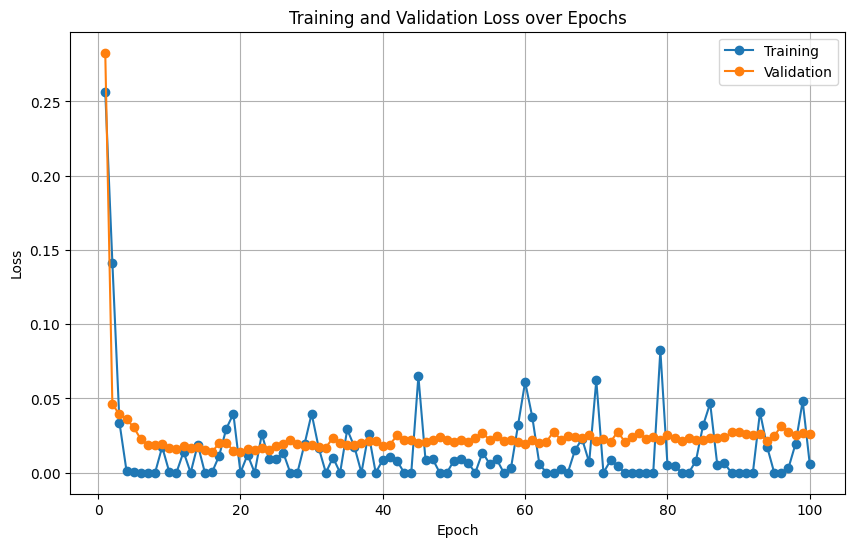

In [7]:
plot_metrics(train_df= trainm_df, val_df = valm_df , metric_column = 'Loss')

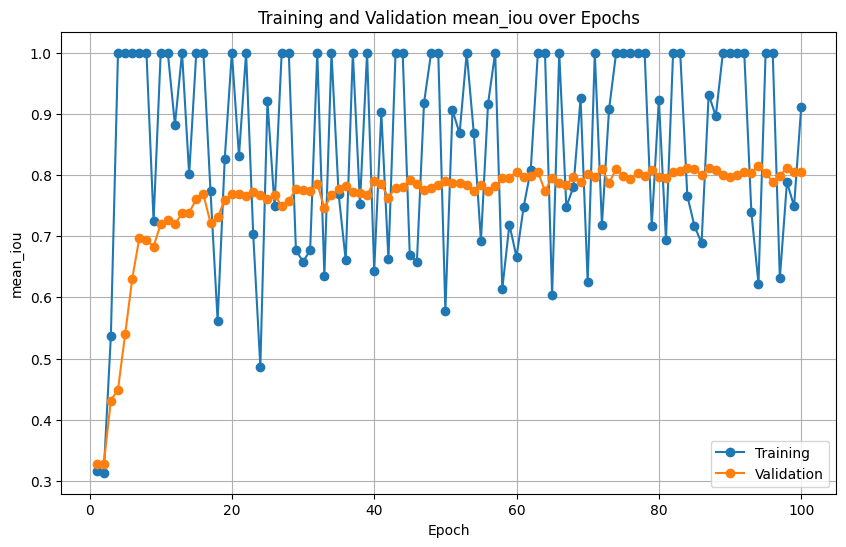

In [8]:
plot_metrics(train_df= trainm_df, val_df = valm_df , metric_column = 'mean_iou')

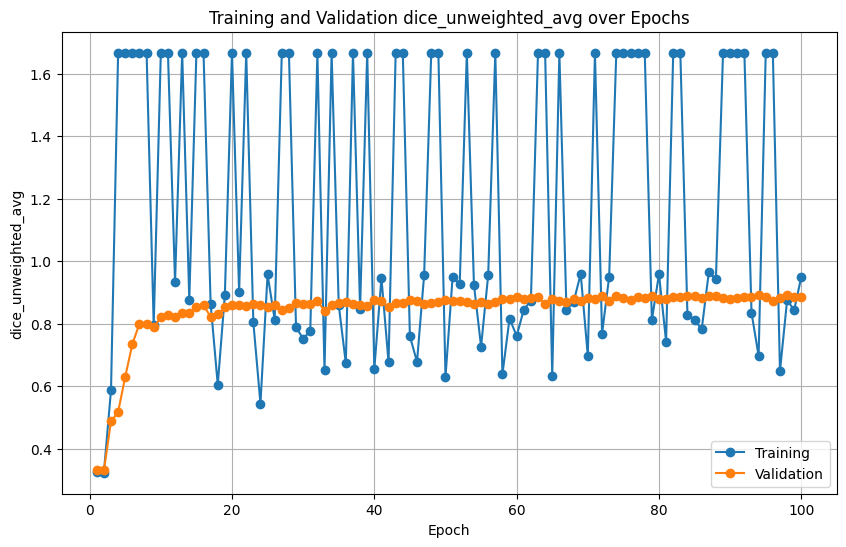

In [9]:
plot_metrics(train_df= trainm_df, val_df = valm_df , metric_column = 'dice_unweighted_avg')

In [32]:
import math

def plot_all_metrics(train_df, val_df):
    # Get all metric columns from the training dataframe
    metric_columns = [col for col in train_df.columns]

    # Calculate the number of rows needed based on the number of columns and desired layout
    num_plots = len(metric_columns)
    n = 3
    num_rows = math.ceil(num_plots / n)
    num_cols = min(num_plots, n)

    # Create subplots
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

    # Flatten axs if it's a 2D array (i.e., more than one row)
    if num_rows > 1:
        axs = axs.flatten()

    # Plot each metric
    for i, metric_column in enumerate(metric_columns):
        # Choose the subplot
        if num_rows > 1:
            ax = axs[i]
        else:
            ax = axs

        # Plot training metric
        ax.plot(train_df.index.tolist(), train_df[metric_column], label=f'Training {metric_column}', marker='o')

        # Plot validation metric
        ax.plot(val_df.index.tolist(), val_df[metric_column], label=f'Validation {metric_column}', marker='o')

        # Customize the subplot
        ax.set_title(f'{metric_column} over Epochs')
        ax.set_xlabel('Epoch')
        ax.set_ylabel(metric_column)
        #ax.legend()
        ax.grid(True)

    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Show the plot
    plt.show()


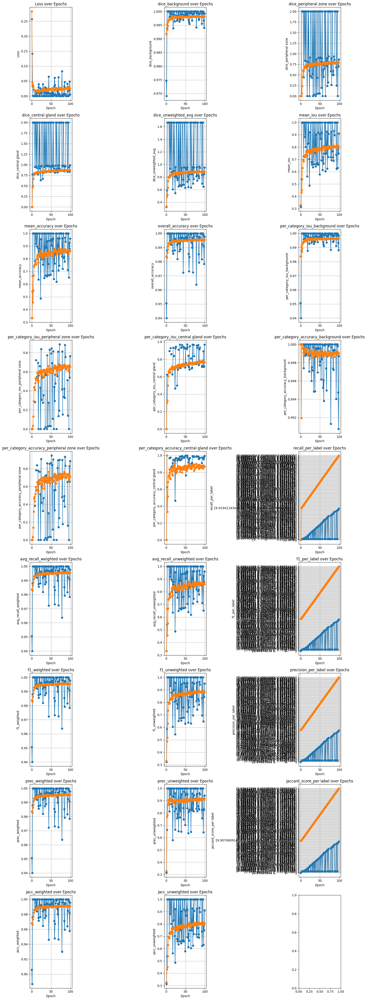

In [11]:
plot_all_metrics(train_df= trainm_df, val_df = valm_df )

## Inference: Model test set evaluation

In [14]:
load_model = True
if load_model:
  model_path = "/content/drive/MyDrive/VCS Project/models/checkpoints/20240209_09_epoch_99_SegFormer_aug_eq.pt"
  model = torch.load(model_path)

In [33]:
%%time
test_images, test_labels, test_predictions, test_metrics = model_eval(model=model, test_dataloader=test_loader,
                                                                      metric=mean_iou, dice_coef_metric=dice_coefficient)

NameError: name 'mean_iou' is not defined

Ground truth


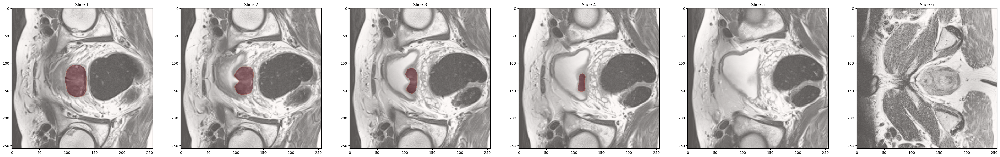

Predictions


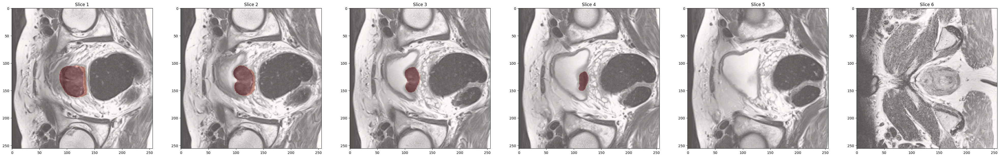

In [ ]:
def display_image_with_mask_i_h_w(image, mask, alpha=0.35):
    num_slices = image.shape[0]
    fig, axes = plt.subplots(1, num_slices, figsize=(50, 50))

    for i in range(num_slices):

        axes[i].imshow(image[i, :, :], cmap='gray')
        axes[i].set_title(f'Slice {i + 1}')

        axes[i].imshow(mask[i, :, :], cmap='Reds', alpha=alpha)

    plt.show()

test_images = test_images.squeeze(axis=1)
ss = 10
es = 20
# GT
print(f'Ground truth')
display_image_with_mask_i_h_w(test_images[ss:es], test_labels[ss:es], alpha=0.35)
# Predictions
print(f'Predictions')
display_image_with_mask_i_h_w(test_images[ss:es], test_predictions[ss:es], alpha=0.35)

In [ ]:
print(test_images.shape)

(16, 1, 256, 256)


In [ ]:
ss = 10
es = 18
# GT
print(f'Ground truth')
display_image_with_mask_i_h_w(test_images[ss:es].cpu().numpy(), test_labels[ss:es].cpu().numpy(), alpha=0.35)
# Predictions
print(f'Predictions')
display_image_with_mask_i_h_w(test_images[ss:es].cpu().numpy(), test_predictions[ss:es].cpu().numpy(), alpha=0.35)

Ground truth


AttributeError: 'numpy.ndarray' object has no attribute 'cpu'